This Jupyter notebook is a property of the University of California and copyrighted by Dipak Ghosal. Only personal use for ECS 132 and ECS 256 classes is allowed. Uploading this to any shared site is a violation of the University of California copyright laws

# A Project on Covert Timing Channels

## Instructions

    1. You may in no circumstances upload this project to private tutoring websites such as CourseHero or Chegg. Remember all material related to this course  is a property of the University of California and posting them is a violation of the copyright laws and will lead to serious consequences. 
    
    2. In doing this project if you refer to a source (either a book or the internet), you must cite it.
    
    3. You are highly urged to work on this project on your own.  If you do discuss with others,  you must list their names. 
    
    4. This Jupyter Notebook requires Python 3 ipykernel. You  must write your code in Python 3. Make sure to run this notebook under the Python kernel.

## 1. Introduction
The goal of this project is to learn about how to design, detect, and implement a covert timing channel using a stream of packets generated by an application.  We will do this project in steps. At this point we will get started with the first simple step. 

## 2. Background

Covert communication is method of exchanging secret messages in which the communication is hidden. A related term is steganography which  deals with methods  to write/embed hidden messages in such a way that no one, other than the sender and the intended receiver, know the existence of the message. The word steganography is of Greek origin and means "concealed writing" from the Greek words steganos meaning "covered or protected", and graphei meaning "writing" [From Wikipedia]. Steganography and covert channels have a long history and was used  in WWII to send secret messages to spies behind enemy lines. In the computer and network security, covert channels and steganography  fall in the broad category of security through obscurity.

The advantage of a covert channel over cryptography is that messages do not attract attention to themselves. Plainly visible encrypted messages — no matter how unbreakable — will arouse suspicion. The very presence of encrypted messages may be incriminating in countries where encryption is illegal. In such cases the communication channel must itself be hidden and this is achieved using covert channels / steganography. Note that, cryptography protects the contents of a message. Covert communication on the other hand protects both the message and the communicating parties.

Typically, steganography refers to the concealment of information within a document file, image file, or program. Media files are ideal for steganographic transmission because of their large size. As a simple example, a sender might start with an innocuous image file and adjust the color of every 100th pixel to correspond to a letter in the alphabet. The overall change is so small  that someone not specifically looking for it is unlikely to notice it. Another method is called the Least Significant Bit (LSB) substitution. In this method, the least significant bit of each  pixel in a digital image is modified by the bits  of the secret message. Since the LSB contributes very little to the overall (intensity/color/brightness) of each pixel, the change in the image will be imperceptible to the naked eye.

Covert channels are communication channels that are established over some overt medium. For example, we can uses a stream of network packets (for example stream of packets generated by a Skype call) as the overt carrier for a covert communication channel. As usual, we have our three characters Alice, Bob, and Eve. Alice and Bob are in a repressive country where all communication is monitored and they want to establish a covert channel to exchange secret messages. Eve is a warden who can look at all network packets and try to detect if any covert communication is being used to plan a uprising against the repressive state.

To setup a covert communication channel, Alice and Bob first initiate an overt application let say a (computer to computer) Skype call and they start a regular innocuous conversation. Their interactive conversation produces a stream of IP packets from Alice to Bob and Bob to Alice.  For the time being let us only consider covert channel in one direction from Alice to Bob and hence only consider the IP packets stream from Alice to Bob. There are two ways in which Alice can send a secret message. She can replace some unused bits in the protocol header with the bits of the covert message. This is called a **covert storage channel**. These types of channels are easily detectable since the protocol header fields that are not used are well known to Eve and she can check bits to detect the covert channel, identify Alice and Bob and the covert message. The other method that Alice can uses is to alter the inter-packet delays of the IP packet using a pre-established shared key to modulate the bits of the secret message. This is called a **covert timing channel** and will be the focus of our study.  

## 3. A Concrete Example

To make things more concrete lets consider a concrete example. For simplicity, we will assume that Alice has buffered a large number of the IP packets that she has generated (as a result of her talking). This is obviously not realistic [why?] but for this first step let's make this assumption. Each packet has two attributes 1) a sequence number and 2) the time when the packet was generated. Thus, P(n, tn) denotes packet n which was generated at time tn. We will assume that the first packet is numbered 1 and is generated at  time 0, i.e.,  t1 = 0. Note that the time field gives the cumulative time. To obtain the inter-packet delay, we can take the time difference between the consecutive packets.  This packet stream is the unmodified overt traffic.
Alice and Bob have a priori decided that an inter-packet delay of 0.5 will  be used to code 1 and an inter-packet delay of 0.1 will be used to code a 0. So if Alice wants to send the alphabet “b” (which isd 0110 0010) she will generate the following sequence of packets P(1, T0), P(2, T1=T0+0.1), P(3, T2=T1+0.5), P(3, T3 = T2+0.1), P(4, T4 = T3+0.1) for the first 4 bits starting from the LSB.  This  is shown in the Figure below. 

<figure> 
    <img src="Figures/Timing-Channel-Example.jpg" width="800" height="600">
    <figcaption align = "center"><b>Figure - A very simplistic timing channel </b></figcaption>
</figure>


If the timing between the packets are not altered by the network or by Eve, then Bob can observe  the inter-packet delays, translate them to binary  bits and then determine the corresponding character.  In this assignment, we will try to design a method of modulating the bits into inter-packet delays such that Eve is not able to discover the channel. We will assume that the network or Eve will not modify the inter-packet delays.

## 4.  A First Simple Design

Alice ad Bob are having a Skype call. When Alice talks, the Skype application generates packets. This is called the **overt packet stream**. In her computer Alice has created a packet buffer (in memory)  which holds a bunch of packets (as many as required to send the secret message) and then a using aspecially designed packet scheduler releases the packet with interpacket delays that encode the secret message.  The overall system in Alice's computer is shown in the Figure below.  In this part of the project we  will consider a few simple scheme for encoding a secret message in the inter-packet delays. 

<figure> 
    <img src="Figures/Timing-Channel-Alice.jpg" width="800" height="600">
    <figcaption align = "center"><b>Figure showing the setup in Alice's computer. The overt stream of packets is generated by the Skype application. The inter-packet delays has some (given)  random distribution. The covert packet stream is generated by the packet scheduler. The inter-packet delays are chosen suh that they encode the secret message.  </b></figcaption>
</figure>



### 4.1 Secret Message 

The secret message that Alice wants to send to Bob  is \``this is a secret message\''  The characters are encoded using 8 bits ASCII. Write a code to convert  the secret message into a sequence of bits. Include the spaces as well. You can use the bin and ord  functions as shown below.  

In [1]:
bin(ord("t"))

'0b1110100'

You can remove the 'b' 

In [2]:
bin(ord("t")).replace('b','')

'01110100'

In [90]:
import numpy as np
from typing import List
import os
import math
import random

Include the code that generates the bit sequence in a file named "secret_message_bits"

In [66]:

class Util():
    """This class will have utility functions like dealing with binary values
    """
    def __init__(self):
        pass
    
    def __init__(self, constant_ticks):
        self.tick = constant_ticks

    def convert_char_2_8b_ASCII(self, input : str):
        if len(input) == 1:
            return "0" * (8 - len(bin(ord(input))[2:])) + bin(ord(input))[2:]
        raise ValueError

    def convert_int_2_8b_ASCII(self, input : int):
        # Returns a 8 character string with the binary value
        return "0" * (8 - len(bin(input)[2:])) + bin(input)[2:]
    
    def convert_str_2_8b_ASCII_vector(self, input) -> List[str]:
        vector = []
        for i in range(len(input)):
            vector.append(self.convert_char_2_8b_ASCII(input[i]))
        return vector
    
    def convert_str_2_8b_ASCII_string(self, input) -> List[str]:
        string = ""
        for i in range(len(input)):
            string += self.convert_char_2_8b_ASCII(input[i])
        return string
    
    def convert_time_to_sec(self, tick):
        return float(tick)/float(self.tick)
    
    def convert_time_array(self, array):
        for idx, data in enumerate(array):
            array[idx] = self.convert_time_to_sec(data)
        return array
    
    def convert_8_bit_ASCII_to_str(self, input):
        return chr(int(input, 2))
    
    def convert_ASCII_vector_to_str(self, input) -> List[str]:
        output = []
        for i in input:
            output.append(self.convert_8_bit_ASCII_to_str(i))
        return output
    
    def convert_str_to_pkt(self, input):
        return [input]

# --------------------------------------------------------------------------- #

class BaseTrafficGenerator(Util):
    """This class will have the basic functions to create a stream of network
    traffic.
    
    :params:
    
    """
    def __init__(self,
                 traffic_type: str,     # linear or random
                 rate: int,             # Number of packets per sec
                 duration: int,          # time in seconds
                 start = 0x0,
                 ):
        # Traffic type can be either linear or random for testing.
        supported_traffic = ["linear", "random"]
        if traffic_type.lower() not in supported_traffic:
            raise NotImplementedError(
                f"Unknown traffic type {traffic_type} detected!" +
                f"Supported types are {str(supported_traffic)}"
            )
        self.traffic_type = traffic_type.lower()
        self.current_traffic = start
        self.rate = rate
        self.local_time = 0
        self.duration = duration
        
        # The output of this stream 
        self.output_stream = []
    
    def generate_traffic(self):
        while self.local_time < self.duration:
            self.local_time += 1
            if self.traffic_type == "linear":
                self.output_stream.append(self._generate_linear())
            else:
                return self._generate_random()
        return self.output_stream
        
    def _generate_linear(self):
        self.current_traffic += 1
        return self.convert_int_2_8b_ASCII(self.current_traffic)
        
    def update_time(self):
        pass
        

# GlobalEventQueue = []
# global_time = 0
# TimeInterval = 1    # 1 sec

# x = Util(1000)
# print(x.convert_int_2_8b_ASCII(1))

# tgen = BaseTrafficGenerator("linear", 1, 100)

# print(tgen.generate_traffic())
# print(x.convert_char_2_8b_ASCII("1"))
# print()

# test_string = "secret_message_bits"
# print(x.convert_str_2_8b_ASCII_vector(test_string))


In [67]:
# Code to open and close a file.
dir_name = "project_files"
file_name = "secret_message_bits.txt"

if not os.path.exists(os.path.join(os.getcwd(), dir_name)):
    os.mkdir(dir_name)

if not os.path.exists(
        os.path.join(os.path.join(os.getcwd(), dir_name), file_name)):
    print("Creating the file")
    os.system("echo \"This is a secret message ending with 000\"" +
              f" > {dir_name}/{file_name}")


file_object = open(f"{dir_name}/{file_name}", "r")
contents = file_object.read()
print(contents)

util_class_object = Util(constant_ticks=None)

input_packets = util_class_object.convert_str_2_8b_ASCII_vector(contents)
file_object.close()

# Sanity check to verify the encoding is true:
output_packets = util_class_object.convert_ASCII_vector_to_str(input_packets)
print(input_packets)
print("".join(output_packets))


This is a secret message ending with 000

['01010100', '01101000', '01101001', '01110011', '00100000', '01101001', '01110011', '00100000', '01100001', '00100000', '01110011', '01100101', '01100011', '01110010', '01100101', '01110100', '00100000', '01101101', '01100101', '01110011', '01110011', '01100001', '01100111', '01100101', '00100000', '01100101', '01101110', '01100100', '01101001', '01101110', '01100111', '00100000', '01110111', '01101001', '01110100', '01101000', '00100000', '00110000', '00110000', '00110000', '00001010']
This is a secret message ending with 000



### 4.2 Obtaining the Baseline

Alice has buffered a sequence of packets that was generated by Skype. This is given in a excel file.  This called the overt packet stream. Write a Python code to plot the histogram of the **inter-packet delays** of the overt packet stream.  This is the baseline. This statistical characteristic of the packet stream is known to Eve and she will use this to see if any given packet stream between Alice and Bob is suspicious. In Section 7 (Detection) we will learn of techniquess of how  Eve will actually do this. 

In [1181]:
# Include the code that generates the histogram
def find_quantum(string_array):
    # We need to find the longest string to find the correct tick value.
    length = 0
    for i in range(int(string_array.shape[0])):
        string = string_array[i][1][string_array[i][1].find(".") + 1:]
        if length < len(string):
            length = len(string)
            print(length, end = " ")
    return (10 ** (length - 1))
    
print("Opening the csv file")

def scale_matrix(raw_data, const_tick):
    hist_data = np.zeros((raw_data.shape), dtype=np.uint)
    for i in range(int(raw_data.shape[0])):
        # index is int
        hist_data[i][0] = np.uint(raw_data[i][0])
        hist_data[i][1] = np.uint(np.longdouble(raw_data[i][1]) * const_tick)
    return hist_data

def scale_matrixx(raw_data, const_tick):
    hist_data = np.zeros((raw_data.shape), dtype=np.float_)
    for i in range(int(raw_data.shape[0])):
        # index is int
        hist_data[i][0] = np.float_(raw_data[i][0])
        hist_data[i][1] = np.float_(np.longdouble(raw_data[i][1]) * const_tick)
    return hist_data

raw_data = np.loadtxt(
    os.path.join(os.getcwd(), "project_files/Traffic_data_orig.csv"),
    delimiter=",",
    dtype = str,
    skiprows=1)

# Python has issue with floating point numbers regarding precision. Since we
# are working with timing channels, which requires precision, therefore,
# we will convert this matrix as string -> float -> int
print(raw_data[1][1], float(raw_data[1][1]))

# convert time.
# 1 sec = `const_tick` ticks
const_tick = find_quantum(raw_data)
print(const_tick)
# raw_data = scale_matrix(raw_data, const_tick)
raw_data = scale_matrixx(raw_data, 1)

print(raw_data)

inter_packet_arrival_time = []
# print(raw_data.shape[0])
for i in range(int(raw_data.shape[0]) - 1):
    inter_packet_arrival_time.append(raw_data[i + 1][1] - raw_data[i][1])

print(inter_packet_arrival_time)

Opening the csv file
0.001104246 0.001104246
1 9 100000000
[[1.000000e+00 0.000000e+00]
 [2.000000e+00 1.104246e-03]
 [3.000000e+00 7.636533e-03]
 ...
 [4.990000e+02 5.047385e+01]
 [5.000000e+02 5.055112e+01]
 [5.010000e+02 5.056366e+01]]
[0.001104246, 0.006532287, 0.033204516999999996, 0.07820445000000001, 0.17427499999999999, 0.24128099999999997, 0.03479350000000003, 0.021858299999999997, 0.016695600000000033, 0.01445659999999993, 0.24829460000000003, 0.26099590000000006, 0.03414699999999993, 0.13881500000000013, 0.21728799999999993, 0.045984000000000025, 0.23240499999999997, 0.05338799999999999, 0.22703700000000016, 0.06188799999999972, 0.028604000000000074, 0.027172000000000196, 0.05866399999999983, 0.0036360000000001946, 0.16555399999999976, 0.07009800000000022, 0.024068999999999896, 0.024899000000000004, 0.047414999999999985, 0.009129000000000165, 0.0148419999999998, 0.03129099999999996, 0.0776650000000001, 0.2427600000000001, 0.016515999999999753, 0.3451949999999999, 0.096254000

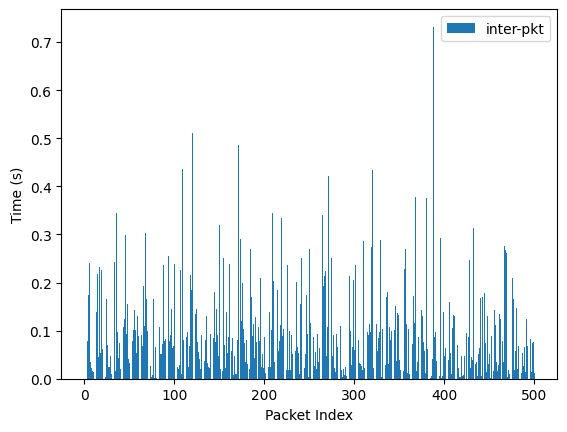

In [91]:
import matplotlib.pyplot as plt

# overwriting all util_class objects
util_class_object = Util(constant_ticks=const_tick)
inter_packet_arrival_time = util_class_object.convert_time_array(
                                inter_packet_arrival_time)


plt.bar([i for i in range(len(inter_packet_arrival_time))], 
         inter_packet_arrival_time, label="inter-pkt")
plt.legend()
plt.xlabel("Packet Index")
plt.ylabel("Time (s)")
plt.show()

In [ ]:
# Include the histogram (jpeg or pdf). You run the above code. Save the histogram as a pdf of jpeg file and then load it here. 

In [ ]:
# Try to extract bit information

### 4.3 A Simple Modulation Scheme

Alice and Bob decide to use the following modulation scheme to map the bits to the inter-packet delay. A delay of 0.25 is used to encode a bit 0 and delay of 0.75 is used to encode a bit 1. Write a Python code  that will generate the modified packet stream that contains the secret message. Note  that you will not need all the packets that you are given. 

In [106]:
# Include the code here
#
# We will use time interval as 1000 to keep time as int.
# 1 sec = 1000

const_tick = 1000000

def convert_sec_to_ticks(time_in_sec, tick):
    return np.uint(time_in_sec * tick)

class UtilTime(Util):
    """This class adds timing information to the util class

    Args:
        Util (_type_): _description_
    """
    def __init__(self,
                 constant_tick,
                 packet_size = 8,
                 time_for_0 = 0,
                 time_for_1 = 0
        ):
        super().__init__(constant_tick)
        self.packet_size = packet_size
        self.time_map = [time_for_0, time_for_1]
    
    def convert_char_w_time(self, input):
        # Assuming a packet is a 8 bit 
        value = self.convert_char_2_8b_ASCII(input)
        # sanity check
        time = 0
        assert(len(value) == self.packet_size)
        for i in range(len(value)):
            time += self.time_map[int(value[i])]
        return value, time
        
    def convert_str_with_time(self, input):
        vector = []
        times = []
        for i in range(len(input)):
            val, t = self.convert_char_w_time(input[i])
            vector.append(val)
            times.append(t)
        return vector, times
    
    def get_time_per_packet(self, packet):
        time = 0
        for i in range(len(packet)):
            time += self.time_map[int(packet[i])]
        return time

x = UtilTime(constant_tick = const_tick, time_for_0=250, time_for_1=750)
y = x.convert_str_with_time("01")
print(y[1][0], x.convert_time_to_sec(y[1][0]), "sec")

3000 0.003 sec


In [107]:
# Recap the packet information
print(input_packets)

# We need to encode this vector with timing information. First we use an ideal
# encoder with exactly equal encoding time. This example uses 0.5 sec to encode
# both 0 and 1
ideal_encoder = UtilTime(constant_tick=const_tick,
                         time_for_0=convert_sec_to_ticks(0.5, const_tick),
                         time_for_1=convert_sec_to_ticks(0.5, const_tick))
simple_encoder = UtilTime(constant_tick=const_tick,
                         time_for_0=convert_sec_to_ticks(0.25, const_tick),
                         time_for_1=convert_sec_to_ticks(0.75, const_tick))

ideal_packet_times = []
simple_packet_times = []
for packet in input_packets:
    ideal_packet_times.append(ideal_encoder.get_time_per_packet(packet))
    simple_packet_times.append(simple_encoder.get_time_per_packet(packet))


['01010100', '01101000', '01101001', '01110011', '00100000', '01101001', '01110011', '00100000', '01100001', '00100000', '01110011', '01100101', '01100011', '01110010', '01100101', '01110100', '00100000', '01101101', '01100101', '01110011', '01110011', '01100001', '01100111', '01100101', '00100000', '01100101', '01101110', '01100100', '01101001', '01101110', '01100111', '00100000', '01110111', '01101001', '01110100', '01101000', '00100000', '00110000', '00110000', '00110000', '00001010']


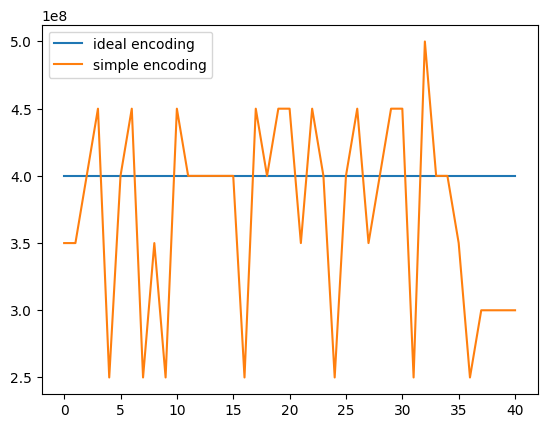

In [151]:
# create a graph for the encodign times.
plt.plot([i for i in range(len(ideal_packet_times))],
                    ideal_packet_times, label="ideal encoding")
plt.plot([i for i in range(len(simple_packet_times))],
                    simple_packet_times, label="simple encoding")
plt.legend()
plt.show()

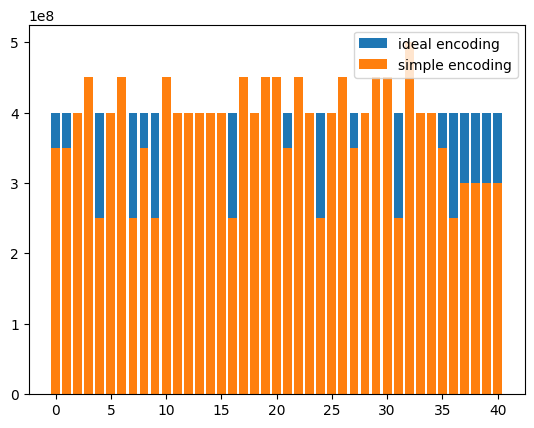

In [152]:
# create a graph for the encodign times.
plt.bar([i for i in range(len(ideal_packet_times))],
                    ideal_packet_times, label="ideal encoding")
plt.bar([i for i in range(len(simple_packet_times))],
                    simple_packet_times, label="simple encoding")
plt.legend()
plt.show()

### 4.4 Histogram of Inter-packet Delays

Plot the histogram of the inter-packet delay of the covert packet stream. Plot the histogram for  the part of the packet stream that you need to encode the secret message.  Will Eve be suspicious?

In [ ]:
# Include the code that generates the histogram

In [ ]:
# Include the histogram (jpeg or pdf). 

### 4.5  A Better Modulation Scheme

Alice and Bob decide to use the following modulation scheme. Let $m$, $\min$, and $\max$ denote the median, min, and max of the inter-packet delay of the overt packet stream. If Alice needs to send a 0 she randomly generates a delay between $m$ and $\min$. If she want to send a 1 she randomly generates a delay between $m$ and $\max$. First, compute $m$, $\min$, and $\max$ of the overt packet stream. Next, modify the code  in  4.3, to generate  the covert  packet stream that contains  the secret message.

In [153]:
# Get mean, median, mode of the dataset
# print(raw_data)
# print(inter_packet_arrival_time)
mean = np.mean(inter_packet_arrival_time, axis = 0)
median = np.median(inter_packet_arrival_time, axis = 0)
min_inter = np.min(inter_packet_arrival_time)
max_inter = np.max(inter_packet_arrival_time)
print(mean, median, min_inter, max_inter)

10112732.0 7690000.0 1000 73199000


In [110]:
# Include the code here

import random

class BetterUtilTime(UtilTime):
    def __init__(self,
                 constant_tick,
                 mean,
                 min,
                 max,
                 median,
                 packet_size = 8,
                 time_for_0 = 0,
                 time_for_1 = 0
        ):
        super().__init__(constant_tick,
                         packet_size,
                         time_for_0,
                         time_for_1)
        self._mean = mean
        self._median = median
        self._min = min
        self._max = max
        
        self._recalc_time()
    
    def _recalc_time(self):
        pass
    
    def _encode_0(self):
        return random.randint(self._min, self._median)
    def _encode_1(self):
        return random.randint(self._median, self._max)
    
    # overrides get_time_per_packet
    def get_time_per_packet(self, packet):
        time = 0
        for i in range(len(packet)):
            if packet[i] == "0":
                time += self._encode_0()
            else:
                time += self._encode_1()
        return time
            
     
        

In [ ]:
better_encoder = BetterUtilTime(constant_tick=const_tick,
                         mean = mean,
                         median = median,
                         min = min_inter,
                         max = max_inter)

better_packet_times = []

for packet in input_packets:
    better_packet_times.append(better_encoder.get_time_per_packet(packet))   

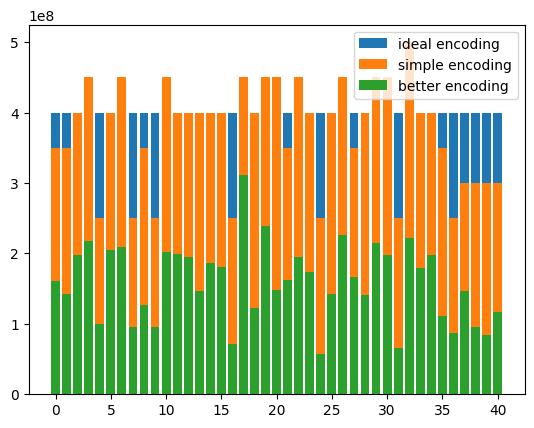

In [155]:
# create a graph for the encodign times.
plt.bar([i for i in range(len(ideal_packet_times))],
                    ideal_packet_times, label="ideal encoding")
plt.bar([i for i in range(len(simple_packet_times))],
                    simple_packet_times, label="simple encoding")
plt.bar([i for i in range(len(better_packet_times))],
                    better_packet_times, label="better encoding")
plt.legend()
plt.show()

### 4.6 Histogram of Inter-packet Delays

Plot the histogram  of the inter-packet  delays of the overt packet stream and that of the new covert packet stream. Again, plot the histogram of the part of the packet stream that you need to encode the secret message. Do you think Eve will be suspicious?

In [ ]:
# Include the code that generates the histogram

In [ ]:
# Include the histogram (jpeg or pdf). 

### 4.7  Answer the following questions.

      1. How can you improve upon the method in 4.5?
      
      2. We assumed the Alice will buffer up the packets and we mentioned that it was unrealistic. Why?
      
      3. We have assumed that the network does not alter the inter-packet delays. What would be the problem if it did? Can you suggest methods to mitigate the effect of the changes of the inter-packet delay (noise)?

In [ ]:
# Answers here 
print

## 5. A Real Implementation

In this section, we make the implementation more realistics and address some engineering issues.  

### 5.1 Overview

In the previous part, we assumed that Alice buffers as many packets she requires to transmit the secret message. For eaxmple, if the secret message is 32 bits then Alice will buffer 33 packets and release the packets with appropriate delays based on the encoding scheme to encode the secret message. If the secret message is small, this will work as Alice needs to buffer a small number of packets. However, this will not work if the secret message is long as this will require Alice to buffer large number of packets and this is unealistic (you have found and written good reasons in answering the related question in 4.7 above). 

In [369]:
# We are spliting all the parts here:
# 1. we need buffers for the sender

class Packet:
    def __init__(self,
                 pkt_idx,
                 data = "",
                 enqueue_time = 0,
                 process_time = 0,
                 debug = False):
        self._idx = pkt_idx
        self._debug = debug
        self.data = str(data)
        # The packet can be enqueued anytime, we need to keep a track of that
        # time.
        self.enqueue_time = enqueue_time
        # The packet will get automatically popped if the global event queue
        # timer reaches process time
        self.process_time = process_time
    
    def __del__(self):
        if self._debug == True:
            print(f"info: packet idx {self._idx} was destroyed!")
    
    def func_reset_data(self, data: str):
        # sets data with 0 latency.
        self.data = data
        
    def get_data(self):
        return self.data

class Buffer:
    def __init__(self,
                 buffer_name: str,
                 buffer_size: int,
                 debug = False):
        # Sets up a buffer with a specific size for the simulation
        self._name = buffer_name
        self._buffer_pointer = 0
        self._debug = debug
        self.buffer_size = buffer_size
        self.buffer = []
    
    def __del__(self):
        if self._debug == True:
            print(f"info: Buffer {self._name} was destroyed!")
    
    def _get_buffer_size(self):
        return self.buffer_size
    
    def push(self, packet: Packet):
        # For maintianing naming convention
        return self.enqueue_packet(packet)

    def pop(self,):
        # For maintianing naming convention
        return self.dequeue_packet()

    def enqueue_packet(self, packet: Packet):
        if self._buffer_pointer < self._get_buffer_size() and \
                self._buffer_pointer >= 0:
            # can enqueue this packet into the buffer.
            self.buffer.append(packet)
            self._buffer_pointer += 1
            return True
        elif self._buffer_pointer >= self._get_buffer_size():
            if self._debug == True:
                print(f"warn: buffer overflow with packet {packet._idx}!")
            # could not enqueue this packet
            return False
        else:
            raise NotImplementedError(
                f"fatal: unhandled exception at {self.__name__}")
    
    def get_pop_packet(self):
        if self._buffer_pointer > 0:
            return self.buffer[0]
        else:
            return None
    
    def dequeue_packet(self):
        # Poor implementation of a buffer!
        if self._buffer_pointer <= 0:
            if self._debug == True:
                print(f"warn: buffer underflow!")
            # could not enqueue this packet
            return False
        else:
            # The packet object will get automatically deleted!
            if len(self.buffer) > 0:
                self.buffer = self.buffer[1:]
                self._buffer_pointer -= 1
            else:
                self.buffer = []
                self._buffer_pointer = 0
            return True        

In [63]:
# test code for the buffer
buffer_size = 4
B = Buffer(buffer_name = "test", buffer_size = buffer_size, debug = True)
for i in range(buffer_size):
    pkt = Packet(pkt_idx = i, data = i, debug = False)
    B.push(pkt)
    del(pkt)
print("buffer_size", len(B.buffer))
# print(B.buffer[1].data)

# pop
for i in range(buffer_size - 1):
    B.pop()
print("buffer_size", len(B.buffer))
del(B)

buffer_size 4
4 4
3 3
2 2
buffer_size 1
info: Buffer test was destroyed!



We will denote $m$ to be the size of the secret message. Also let $B$ denote the maximum number of packets that can be buffered at anytime. The issue of having a large $B$ is that packets that are at the end of the buffer  must wait for all the packets that in the front to be transmitted. This may cause unacceptable delays for the packets. The value of $B$ will be determined by the overt application that ALice is using. For example, for real-time application (such as Augmented Reality/Virtual Reality applications) $B$ will be small whereas for Email application $B$ can be large.   In this study we will consider different values of $m$ and $B$ with $m \geq B$ and Alice, Eve and Bob know the value of $B$ since they all know what is the overt application Alice is using. 

Given $m$ and $B$ what should be Alice's strategy be to tranmit the secret message? There are two important constraints: 

1. Alice cannot buffer more than $B$ packets because of the reason above.
2. Once she starts to transmit the secret message she cannot stop (because she has no way of letting Bob know). She must try to compelete sending the entire secret message.

Alice follows the following strategy. Before starting to transmit the secret message she buffers $i$ ($0 \geq i \leq B$) packets and then starts to release the packets to transmit the secret message. In order to determine what should $i$ be we need to discuss two system states that we need to worry about - buffer overflow and buffer underflow. Let's understand what these are, why these can occur and what are the factors that determine when they will occur. 

In [68]:
# We are using temporary secret message for this part.
# TODO: merge this code with Util class

secret_message = "11110000"
m = len(secret_message)

# Number of buffers required B = m + 1, or will be determined by the app Alice
# is using. m >= B
for i in range(m):
    # The number of packets that Alice buffers is denoted by `batch_size`
    batch_size = i

1. **Buffer Overflow**: This happens when the buffer already has $B$ packets and another packet arrives from the application. Recall we have said that the number of packets in the buffer cannot exceed $B$. To build  intuition as to when this happens let's consider a specific scenario. Suppose we have set $B = 10$, $m = 32$ and $i=8$. Since $i = 8$,  Alice will first buffer 8 packets. As soon as the 8th packet arrives from the application, she will start transmitting packets with inter-packet delays that encode the secret message.  While she release the packet from the buffer, new packets may arrive from the application that will be appended to the buffer. So the number of packets in the buffer will keep changing - decrease when a packet is transmitted and increase when a packet is generated by the application. Suppose at some time there 7 packets in the buffer and before the next packet is to be transmitted 4 packets arrive in quick succession from the application. This will cause the number of packets in the buffer to go beyond 10 and that will be a violation of policy at most 10 packets can be buffered. Essentially, if packets arrive faster than they are transmitted out, there will be buffer overflow. If $i$ is set close to $B$ there is likely to be an overflow. 


2. **Buffer Underflow**: This happens when a packet must be transmitted (to encode a bit of the secret message) but there are no packets in the buffer. Recall the constraint that once Alice starts to transmit the secret message she cannot stop. Hence, if packets arrive slower than they are transmitted there is likely  be buffer underflow. If $i$ is set close to 0, there is likely to be an underflow. 


**If either of the above two cases (buffer overflow and buffer underflow) arise during the process of sending the secret message we will consider that to be a failure of the covert channel. 


There are many factors that will determine if the covert channel will go into overflow and underflow. These include $m$, $B$, $i$, distribution of the inter-packet delay of the overt application, and the encoding scheme. In this part of the project we will write a simulation to study some of the above factors on the success of transmitting a secret message.  The overall sender-side system is shown in the Figure below. 


<figure> 
    <img src="Figures/ctc-implementation.jpg" width="600" height="400">
    <figcaption align = "center"><b>The overall system diagram of the source and the covert sender. </b></figcaption>
</figure>
 

### 5.2 Assumptions

  1. We will consider that the source generates packet following well-known IPD distributions. Specifically, we will consider two cases a) Exponential and b) Uniform. The sender (Alice) also knows this distribution and follows it to inject the delay between the packets to embed the secret message. It is important to note that the source and the sender are independent. Hence, even though they follow the same distribution,  the sequence of delays generated by the source will be different from the sequence of delays generated by the sender.
  
  2. To embed a 0, the sender generates a delay between the minimum value (min) and the median. To embed a 1 the sender generates a delay between the median value and the maximum value (max). Note that  for the Uniform distribution the min, max and median are easy to determine. For the Exponential distribution min is 0, the max is $\infty$. What is the median value of an Exponential distribution with rate parameter $\lambda$ pkts/sec?
  
  3. The secret message is a randomly generated sequence of 1s and 0s of size $m$ bits and is given. We will consider two values $m=16, 32$.
  
  4. The sender has a buffer of size $B$ and initially the sender buffers $i$ packets before starting to send the secret message.

In [921]:
# We need an application source that will generate packets with some timing
# parameters:

class Application:
    def __init__(self,
                 name: str,
                 traffic_type: str,
                 length: int,
                 params: dict):
        self._name = name
        self._type = traffic_type
        if self._type not in ["Exponential", "Uniform"]:
            raise NotImplementedError("Unknown traffic type!")
        self._length = length
        self._params = params

        self.traffic = self.generate_traffic()
        
        self.stats = {}
        self._calc_stats()
        
    def generate_traffic(self):
        if self._type == "Exponential":
            delay_values = np.random.default_rng().exponential(
                scale = self._params["lambda"],
                size = self._length
            )
        elif self._type == "Uniform":
            delay_values = np.random.uniform(
                self._params["low"],
                self._params["high"],
                size = self._length
            )
            # print(delay_values)
        delay_values = np.sort(delay_values)
        return delay_values
    
    def get_traffic_delay(self):
        return self.traffic
    
    def _calc_stats(self):
        if self._type == "Exponential":
            # taken from wikipedia
            self.stats = {
                "min" : min(self.traffic),
                "max" : max(self.traffic),
                "mean" : float(1.0/self._params["lambda"]),
                "median" : float(math.log(2)/self._params["lambda"]),
                "mode" : 0.0,
                "variance" : float(1.0/math.pow(self._params["lambda"], 2))
            }
        elif self._type == "Uniform":
            # taken from wikipedia
            self.stats = {
                "min" : min(self.traffic),
                "max" : max(self.traffic),
                "mean" : float(
                    0.5 * (self._params["low"] + self._params["high"])),
                "median" : float(
                    0.5 * (self._params["low"] + self._params["high"])),
                "mode" : None, #self.get_traffic_delay()[random.randint(
                    # 0, self._length)],
                "variance" : float(1.0/12.0 * (
                    math.pow(self._params["high"] - self._params["low"], 2)))
            }

    def get_stats(self):
        return self.stats

app_delay = Application(
    name = "application delay", traffic_type="Exponential", length=m,
    params={"lambda": 1}
)

class Encoder(Application):
    # This also generates delays but for the encoder. Therefore these are
    # independent.
    def __init__(self,
                 name: str,
                 traffic_type: str,
                 length: int,
                 params: dict):
        super().__init__(name = name,
                        traffic_type = traffic_type,
                        length = length,
                        params = params)

encoder_delay = Encoder(
    name = "application delay", traffic_type="Exponential", length=m,
    params={"lambda": 2}
)
# encoder_delay = Encoder(
#     name = "application delay", traffic_type="Uniform", length=m,
#     params={"high": 4, "low" : 2}
# )
print(app_delay.get_traffic_delay(), encoder_delay.get_traffic_delay())
print(app_delay.get_stats(), encoder_delay.get_stats())

[0.05792973 0.15091542 0.70585483 0.85613505 2.10163895 2.61459827
 3.07343526 3.78592765] [0.3214315  0.35951768 0.64533166 0.70340751 0.82051647 1.03522491
 2.19517272 3.15240753]
{'min': 0.05792972877255135, 'max': 3.785927645813486, 'mean': 1.0, 'median': 0.6931471805599453, 'mode': 0.0, 'variance': 1.0} {'min': 0.3214314988751828, 'max': 3.1524075336963557, 'mean': 0.5, 'median': 0.34657359027997264, 'mode': 0.0, 'variance': 0.25}


In [789]:
# We need a sim quantum to process the entire queue in integers

Q = int(1e3)    # everything is in micro. Anything after that will be rounded
# off to keep simulations simpler but slower!
const_tick = Q
print("sim quantum", Q)

sim quantum 1000


In [790]:
# processing the delays
def convert_to_quantum(time):
    # time is in seconds.
    return int(time * Q)

def process_time_arrays(time_array):
    ret_times = np.zeros(time_array.shape)
    for idx, time in enumerate(time_array):
        ret_times[idx] = convert_to_quantum(time)
    return ret_times

application_times = process_time_arrays(app_delay.get_traffic_delay())
print(app_delay.get_traffic_delay(), application_times)




# class BetterUtilTime(UtilTime):
#     def __init__(self,
#                  constant_tick,
#                  mean,
#                  min,
#                  max,
#                  median,
#                  packet_size = 8,
#                  time_for_0 = 0,
#                  time_for_1 = 0
#         ):

[0.07190639 0.10571692 0.30472949 0.45172233 0.46665809 0.95857383
 1.60579588 1.95838954] [  71.  105.  304.  451.  466.  958. 1605. 1958.]


In [337]:
def create_random_message(size):
    message = []
    for i in range(size):
        message.append(int(random.randint(0, Q) % 2 == 0))
    return message

message_16 = create_random_message(16)
message_32 = create_random_message(32)

In [370]:
# Alice's and Bob's queues must be global for the Event queue to work correctly
# Simulating a basic system with Alice and Bob
# Alice wants to send a message. There are two buffers A and B.

time = 0
event_idx = 0

A = Buffer(buffer_name="alice_buffer", buffer_size=2, debug = True)
B = Buffer(buffer_name="bob_buffer", buffer_size=100)

info: Buffer alice_buffer was destroyed!


In [791]:
event_queue = []

# We need to move this code to a later point

class Event:
    # For a push, we enque a packet into Alice's buffer. For a pop, we deque
    # alice's queue and eqneue Bob's queue with the same packet.
    def __init__(self,
                 idx: int,
                 init_time: int,
                 packet: Packet = None,
                 params: dict = None,
                 debug = False):
        # Application sends this packet at some time.
        self._packet = packet
        self._idx = idx
        self._debug = debug
        
        # This is when Alice sees this packet.
        self._init = int(init_time)
        if self._packet is None:
            self._command = "pop"
        else:
            self._command = "push"
        # We will use the params for min, max and median
        self._params = params
        # We delete this event after it is processed!
        self._end = self._get_end_time()
    
    def __del__(self):
        if self._debug == True:
            print(f"info: Event {self._idx} was peocessed!")
    
    def process_event(self, current_time):
        if self._command == "push":
            # push this packet to Alice's queue at this stage.
            self._packet.process_time = current_time + self._end
            # This event will have a pop event for this packet at the end time.
            return [self._command, A.push(self._packet)]
        else:
            # pop this packet form Alice's queue and push this packet in Bob's
            # queue.
            packet = A.get_pop_packet()
            if packet is not None:
                packet.enqueue_time = current_time
                B.enqueue_packet(packet)
            return [self._command, A.pop()]

    def _get_end_time(self):
        if self._command == "push":
            # find process time from the encoding delays. this time is
            # calculated everytime when a 0 or a 1 is encountered.
            if self._packet.get_data() == "0":
                self._packet.process_time = 10000
                return 10000
            else:
                self._packet.process_time = 33333
                return 33333
    
    def _get_end_time_random(self):
        if self._command == "push":
            # print(convert_to_quantum(self._params["min"]), convert_to_quantum(self._params["median"]), convert_to_quantum(self._params["max"]))
            # find process time from the encoding delays. this time is
            # calculated everytime when a 0 or a 1 is encountered.
            if self._packet.get_data() == "0":
                return random.randint(convert_to_quantum(self._params["min"]),
                                    convert_to_quantum(self._params["median"]))
            else:
                return random.randint(
                                    convert_to_quantum(self._params["median"]),
                                    convert_to_quantum(self._params["max"]))
        # else:
        #     if self._command == "pop":
        #         print(self._end)
        #     raise NotImplementedError


In [667]:
# The first packet is queued at time t = 0. The time it takes to generate these
# packets is determined by the applciation_delay times
raw_application_times = Application(name="app delay",
                                traffic_type="Exponential",
                                length=len(message_32),
                                params={"lambda":1})
print(raw_application_times.get_stats())

raw_interpacket_times = Encoder(name="end delay",
                                traffic_type="Exponential",
                                length=len(message_32),
                                params={"lambda":1})
print(raw_interpacket_times.get_stats())

# raw_interpacket_times = Encoder(name="end delay",
#                                 traffic_type="Uniform",
#                                 length=len(message_32),
#                                 params={"low":0, "high":1})
# print(raw_interpacket_times.get_stats())

{'min': 0.0008978892698338713, 'max': 7.015557520450928, 'mean': 1.0, 'median': 0.6931471805599453, 'mode': 0.0, 'variance': 1.0}
{'min': 0.023559950111319897, 'max': 3.2824396129014475, 'mean': 1.0, 'median': 0.6931471805599453, 'mode': 0.0, 'variance': 1.0}


### 5.3 Project Steps 

  1. For  buffer size $B=20$ we want to find out the probability of overflow  and  underflow, when the IPD follows the Exponential with $\lambda =1$ pkts/sec and $i=2, 6, 10, 14, 18$. Use message size $m = 16, 32$ bits. Tabulate the results. Remember that to determine the probability you need to run multiple (say 500) experiments for each parameter, i.e., for $B = 20, m = 16, i = 2$ run 500 experiments  and determine the probability of overflow and underflow. Similarly for other values of $i$ and $m$. The max value of an Exponential distribution is $\infty$. For this study  we can limit the max value to say 5 ~secs$. 
  
  2. ***Ignore this step*** For  buffer size $B=20$ we want to find out the probability of overflow  and  underflow, when the IPD follows the Uniform distribution in the range (0,1)  and $i=2, 6, 10, 14, 18$. Use message size $m = 16, 32$ bits.  Tabulate the results. Remember that to determine the probability you need to run multiple (say 500) experiments for each parameter, i.e., for $B = 20, m = 16, i = 2$ run 500 experiments  and determine the probability of overflow and underflow. Similarly for other values of $i$ and $m$.

  
  3. Propose methods to deal with buffer overflow and underflow.

In [324]:
def insert_event(new_event, event_queue):
    print(event_queue)
    return_event = []
    flag = False
    if len(event_queue) == 0:
        return_event.append(new_event)
    
    if len(event_queue) == 1:
        if new_event._init >= event_queue[0]._init:
            return_event.append(event_queue[0])
            return_event.append(new_event)
        
    for event in event_queue:
        if event._init < new_event._init:
            return_event.append(event)
        elif new_event._init >= event._init and flag == False:
            flag = True
            return_event.append(new_event)
        else:
            return_event.append(event)
    print(return_event)
    assert(len(event_queue) + 1 == len(return_event))
    return return_event
        

In [322]:
def simulate(message):
    # reset the buffers
    A = Buffer(buffer_name="alice_buffer", buffer_size=2)
    B = Buffer(buffer_name="bob_buffer", buffer_size=100)
    event_queue = []
    time = 0
    event_idx = 0
    # message_16 = [0, 1]
    # We need the initial packet to be enqued in the event queue. we already have
    # the input messages message_16 and message_32
    print(f"The application generated this message to send: {message}")
    # Encoding times can be calculated using the distribution. The encoding times
    # are randomly computed wile processing an event.
    processed_application_times = process_time_arrays(
                                        raw_application_times.get_traffic_delay())
    # print(processed_application_times)
    # create an event to encode all the packets. First create packets for all the
    # binary strings. The simulation will end when all the packets are transmitted.
    packet_push_queue = []
    pkt_idx = 0
    for idx, bit in enumerate(message):
        # frist create a packet.
        packet = Packet(
                pkt_idx=pkt_idx, data=bit,
                enqueue_time=processed_application_times[idx])
        # we dont know how long will it take to process this packet. this time will
        # determined by the encoding latency. create an event to find out the
        # encoding time.
        packet_push_queue.append(packet)
        # event_queue.append(Event(idx=event_idx, packet=packet,
        #                          init_time=processed_application_times[idx]))
        pkt_idx += 1

    # enter the first packet manually so that the simulation can start.
    event_queue.append(Event(idx=event_idx,
                            init_time=packet_push_queue[0].enqueue_time,
                            packet=packet_push_queue[0],
                            params=raw_application_times.get_stats()))
    event_idx += 1
    packet_push_queue = packet_push_queue[1:]
    simulation_status = True
    for time in range(0, int(1e20)):
        # ----------------------------------------------------------------------- #
        if len(event_queue) == 0 and len(packet_push_queue) == 0:
            print("All events processed!")
            break
        # ----------------------------------------------------------------------- #
        
        # If there  are events in the packet_push_queue are there in the future
        if len(packet_push_queue) > 0:
            if packet_push_queue[0].enqueue_time == time:
                # event_queue.append(Event(idx=event_idx,
                #                         init_time=time,
                #                         packet=packet_push_queue[0],
                #                         params=raw_application_times.get_stats()))
                if len(packet_push_queue) > 0:
                    # If there are packets left in the queue, update the queue.
                    packet_push_queue = packet_push_queue[1:]
                # create a new event to push this.
                event_queue = insert_event(new_event=Event(idx=event_idx,
                                    init_time=time,
                                    packet=packet_push_queue[0],
                                    params=raw_application_times.get_stats()),
                             event_queue=event_queue)
                event_idx += 1
        
        # get the head of the event queue
        if len(event_queue) > 0:
            if time > event_queue[0]._init:
                raise ValueError
            if event_queue[0]._init == time:
                # print(event_queue)
                # print("_______Elements in the event queue_________" , len(event_queue))
                event = event_queue[0]
                if event._command == "push":
                    print(f"info: processing event idx {event._idx}" +
                        f" with action PUSH at time {time}" +
                        f" with packet idx {event._packet._idx}" +
                        f" and data {event._packet.get_data()}" +
                        f" with end time {time + event._end}")
                else:
                    print(f"info: processing event idx {event._idx} with action" +
                        f" POP at time {time}.")
                result = event.process_event(time)
                if event._command == "push":
                    # Now there is a pop command that needs to be queued!
                    event_queue = insert_event(new_event=Event(idx=event_idx+1000,
                                    init_time=time+event._end,
                                    packet=None), event_queue=event_queue)
                    # event_queue.append(Event(idx=event_idx+1000,
                    #                 init_time=time+event._end,
                    #                 packet=None))
                # print(event_queue)
                if result[1] == True:
                    print(f"info: event {result[0]} was successfully processed!")
                else:
                    print(f"fatal: failed at {result[0]}")
                    simulation_status = False
                    break
                # This event is processed. Now see if there are any other event in the
                # queue
                if len(event_queue) > 0:
                    event_queue=event_queue[1:]
        
        # check if we have any push packets in the push_queue. this is being sent
        # by the application.
        # if len(packet_push_queue) > 0:
        #     if len(event_queue) == 0:
        #         # All prior events were processed however there are scheduled
        #         # events in the future. we jump to the future!
        #         time = packet_push_queue[0].enqueue_time - 1
        #     print(time)

    print(f"completed simulation with time {float(time) * 0.000001} s")
    # print(A.buffer, B.buffer)
    return simulation_status

def verify():
    for packets in B.buffer:
        print(packets.get_data(), end=" ")

In [418]:
def insert_event_ver2(event, queue):
    if len(queue) == 0:
        return [event]
    
    elif len(queue) == 1:
        if queue[0]._init < event._init:
            queue.append(event)
        else:
            queue.append(queue[0])
            queue[0] = event
        return queue
    else:
        # find the index where to insert the new event.
        idx = 0
        flag = False
        for events in queue:
            # print(events._init, end=" ")
            if events._init < event._init:
                idx += 1
            elif events._init >= event._init and flag == False:
                break
        queue.insert(idx, event)
        return queue

##############################################################################

def simulate_ver2(message):
    # # reset the buffers
    # A = Buffer(buffer_name="alice_buffer", buffer_size=2, debug=True)
    # B = Buffer(buffer_name="bob_buffer", buffer_size=100)
    event_queue = []
    time = 0
    event_idx = 0
    # message_16 = [0, 1]
    # We need the initial packet to be enqued in the event queue. we already have
    # the input messages message_16 and message_32
    print(f"The application generated this message to send: {message}")
    # Encoding times can be calculated using the distribution. The encoding times
    # are randomly computed wile processing an event.
    processed_application_times = process_time_arrays(
                                        raw_application_times.get_traffic_delay())
    # print(processed_application_times)
    # create an event to encode all the packets. First create packets for all the
    # binary strings. The simulation will end when all the packets are transmitted.
    packet_push_queue = []
    pkt_idx = 0
    for idx, bit in enumerate(message):
        # frist create a packet.
        print(bit, end = " ")
        packet = Packet(
                pkt_idx=pkt_idx, data=bit,
                enqueue_time=int(processed_application_times[idx]))
        # we dont know how long will it take to process this packet. this time will
        # determined by the encoding latency. create an event to find out the
        # encoding time.
        packet_push_queue.append(packet)
        # print(packet.enqueue_time)
        # event_queue.append(Event(idx=event_idx, packet=packet,
        #                          init_time=processed_application_times[idx]))
        pkt_idx += 1

    # enter the first packet manually so that the simulation can start.
    event_queue = insert_event_ver2(event=Event(idx=event_idx,
                                init_time=packet_push_queue[0].enqueue_time,
                                packet=packet_push_queue[0],
                                params=raw_interpacket_times.get_stats()),
                            queue=event_queue)
    event_idx += 1
    packet_push_queue = packet_push_queue[1:]
    simulation_status = True
    for time in range(0, int(1e20)):
        # ----------------------------------------------------------------------- #
        if len(event_queue) == 0 and len(packet_push_queue) == 0:
            print("All events processed!")
            break
        # ----------------------------------------------------------------------- #
        
        # If there  are events in the packet_push_queue are there in the future
        if len(packet_push_queue) > 0:
            if packet_push_queue[0].enqueue_time == time:
                # event_queue.append(Event(idx=event_idx,
                #                         init_time=time,
                #                         packet=packet_push_queue[0],
                #                         params=raw_application_times.get_stats()))
                # create a new event to push this.
                event_queue = insert_event_ver2(event=Event(idx=event_idx,
                                    init_time=time,
                                    packet=packet_push_queue[0],
                                    params=raw_interpacket_times.get_stats()),
                             queue=event_queue)
                event_idx += 1
                if len(packet_push_queue) > 0:
                    # If there are packets left in the queue, update the queue.
                    packet_push_queue = packet_push_queue[1:]
        
        # get the head of the event queue
        if len(event_queue) > 0:
            if time > event_queue[0]._init:
                raise ValueError
            if event_queue[0]._init == time:
                # print(event_queue)
                # print("_______Elements in the event queue_________" , len(event_queue))
                event = event_queue[0]
                if event._command == "push":
                    print(f"info: processing event idx {event._idx}" +
                        f" with action PUSH at time {time}" +
                        f" with packet idx {event._packet._idx}" +
                        f" and data {event._packet.get_data()}" +
                        f" with end time {time + event._end}")
                else:
                    print(f"info: processing event idx {event._idx} with action" +
                        f" POP at time {time}.")
                result = event.process_event(time)
                
                if event._command == "push":
                    # Now there is a pop command that needs to be queued!
                    event_queue = insert_event_ver2(
                                event=Event(idx=event_idx+1000,
                                    init_time=time+event._end,
                                    packet=None),
                                queue=event_queue)
                    # event_queue.append(Event(idx=event_idx+1000,
                    #                 init_time=time+event._end,
                    #                 packet=None))
                # print(event_queue)
                if result[1] == True:
                    print(f"info: event {result[0]} was successfully processed!")
                else:
                    print(f"fatal: failed at {result[0]}")
                    simulation_status = False
                    break
                # This event is processed. Now see if there are any other event in the
                # queue
                if len(event_queue) > 0:
                    event_queue=event_queue[1:]
        
        # check if we have any push packets in the push_queue. this is being sent
        # by the application.
        # if len(packet_push_queue) > 0:
        #     if len(event_queue) == 0:
        #         # All prior events were processed however there are scheduled
        #         # events in the future. we jump to the future!
        #         time = packet_push_queue[0].enqueue_time - 1
        #     print(time)

    print(f"completed simulation with time {float(time) * 0.000001} s")
    # print(A.buffer, B.buffer)
    return simulation_status

def verify():
    for packets in B.buffer:
        print(packets.get_data(), end=" ")

In [372]:
simulate_ver2(message_32)

The application generated this message to send: [0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0]
0 10316
0 14133
1 32366
1 36096
1 40798
0 56001
1 121278
1 126803
0 168834
1 221958
0 230693
0 300622
1 317304
1 368300
0 396992
0 413448
1 422842
0 471730
1 483520
0 516238
1 637427
0 757438
0 790217
0 838804
1 1440372
1 1669048
1 1818632
0 2722829
1 2770567
0 2943143
1 3357786
0 4188904
info: processing event idx 0 with action PUSH at time 10316 with packet idx 0 and data 0 with end time 20316
info: event push was successfully processed!
info: processing event idx 1 with action PUSH at time 14133 with packet idx 1 and data 0 with end time 24133
14133 20316 info: event push was successfully processed!
info: processing event idx 1001 with action POP at time 20316.
info: event pop was successfully processed!
info: processing event idx 1002 with action POP at time 24133.
info: event pop was successfully processed!
info: processing event idx 2 wi

False

In [792]:
# Actual simulation code

class EventV2(Event):
    def __init__(self,
                idx: int,
                init_time: int,
                batch_size: int,
                packet: Packet = None,
                params: dict = None,
                debug = False):
        super().__init__(idx=idx,
                         init_time=init_time,
                         packet=packet,
                         params=params,
                         debug=debug)
        
        # We will not pop packets from Alice's buffer until batch_size number
        # of packets are enqueued.
        self._batch_size = batch_size
        # self._pop_queue = []
        # We delete this event after it is processed!
        self._end = self._get_end_time_random()
        
    def process_event(self, current_time, Alice, Bob):
        if self._command == "push":
            # push this packet to Alice's queue at this stage.
            self._packet.process_time = current_time + self._end
            # This event will have a pop event for this packet at the end time.
            return [self._command, Alice.push(self._packet), None]
        else:
            # pop this packet form Alice's queue and push this packet in Bob's
            # queue.
            # We only start processing packets if there are batch_size number
            # of packets are present.
            if len(Alice.buffer) <= self._batch_size:
                # need to keep this pop event pending
                self._init=self._init + 1
                return [self._command, False, "+1", self]
            else:
                packet = Alice.get_pop_packet()
                if packet is not None:
                    packet.enqueue_time = current_time
                    Bob.enqueue_packet(packet)
                return [self._command, Alice.pop(), None]

def simulate_ver3(
        message, alice_buffer, bob_buffer, batch_size, debug = False):
    # # reset the buffers
    # A = Buffer(buffer_name="alice_buffer", buffer_size=2, debug=True)
    # B = Buffer(buffer_name="bob_buffer", buffer_size=100)
    event_queue = []
    time = 0
    event_idx = 0
    fail_reason = 0
    # message_16 = [0, 1]
    # We need the initial packet to be enqued in the event queue. we already have
    # the input messages message_16 and message_32
    if debug == True:
        print(f"The application generated this message to send: {message}")
    # Encoding times can be calculated using the distribution. The encoding times
    # are randomly computed wile processing an event.
    processed_application_times = process_time_arrays(
                                        raw_application_times.get_traffic_delay())
    # print(processed_application_times)
    # create an event to encode all the packets. First create packets for all the
    # binary strings. The simulation will end when all the packets are transmitted.
    packet_push_queue = []
    pkt_idx = 0
    for idx, bit in enumerate(message):
        # frist create a packet.
        packet = Packet(
                pkt_idx=pkt_idx, data=bit,
                enqueue_time=int(processed_application_times[idx]))
        # we dont know how long will it take to process this packet. this time will
        # determined by the encoding latency. create an event to find out the
        # encoding time.
        packet_push_queue.append(packet)
        # print(packet.enqueue_time)
        # event_queue.append(Event(idx=event_idx, packet=packet,
        #                          init_time=processed_application_times[idx]))
        pkt_idx += 1
    # print()
    # enter the first packet manually so that the simulation can start.
    event_queue = insert_event_ver2(event=EventV2(idx=event_idx,
                                init_time=packet_push_queue[0].enqueue_time,
                                batch_size=batch_size,
                                packet=packet_push_queue[0],
                                params=raw_interpacket_times.get_stats()),
                            queue=event_queue)
    event_idx += 1
    packet_push_queue = packet_push_queue[1:]
    simulation_status = True
    for time in range(0, int(1e20)):
        # ------------------------------------------------------------------- #
        if len(event_queue) == 0 and len(packet_push_queue) == 0:
            if debug == True:
                print("All events processed!")
            break
        # ------------------------------------------------------------------- #
        
        # If there  are events in the packet_push_queue are there in the future
        if len(packet_push_queue) > 0:
            if packet_push_queue[0].enqueue_time == time:
                event_queue = insert_event_ver2(event=EventV2(idx=event_idx,
                                    init_time=time,
                                    batch_size=batch_size,
                                    packet=packet_push_queue[0],
                                    params=raw_interpacket_times.get_stats()),
                             queue=event_queue)
                event_idx += 1
                if len(packet_push_queue) > 0:
                    # If there are packets left in the queue, update the queue.
                    packet_push_queue = packet_push_queue[1:]
        
        # get the head of the event queue
        if len(event_queue) > 0:
            if time > event_queue[0]._init:
                raise ValueError
            # event_with_same_time = []
            # for event in event_queue:
            #     if event._init == time:
            #         event_with_same_time.append()
            #     else:
            #         break
            if event_queue[0]._init == time:
                # print(time, end=" ")
                event = event_queue[0]
                if event._command == "push":
                    if debug == True:
                        print(f"info: processing event idx {event._idx}" +
                            f" with action PUSH at time {time}" +
                            f" with packet idx {event._packet._idx}" +
                            f" and data {event._packet.get_data()}" +
                            f" with end time {time + event._end}")
                else:
                    # we can only start popping if there are batch_size number
                    # of packets in Alice's buffer.
                    if len(alice_buffer.buffer) == batch_size:
                        if debug == True:
                            print(f"info: processing event idx {event._idx}" +
                                f" with action POP at time {time} at the" +
                                f" rate {batch_size}.")
                
                # print(f"buffer {len(Ax.buffer)}")
                result = event.process_event(time, alice_buffer, bob_buffer)
                
                if event._command == "push":
                    # Now there is a pop command that needs to be queued!
                    event_queue = insert_event_ver2(
                                event=EventV2(idx=event_idx+1000,
                                    init_time=time+event._end,
                                    batch_size=batch_size,
                                    packet=None),
                                queue=event_queue)
                    # print(time+event._end)

                     
                if result[1] == True and result[2] is None:
                    if debug == True:
                        print(f"info: event {result[0]} was successfully" +
                            " processed!")
                else:
                    if result[0] == "push" and result[1] == False:
                        # buffer overflow!
                        print(f"fatal: buffer overflow at {time}")
                        simulation_status = False
                        fail_reason = 1
                        break
                    # Now, see if this event was a pop that could not be
                    # processed
                    elif result[0] == "pop" and result[2] == "+1":
                        if debug == True:
                            print(
                            f"info: a pop packet was delayed at time {time}!")
                        # queue this new event.
                        event_queue = insert_event_ver2(event=result[3], queue=event_queue)
                        
                    elif result[0] == "pop" and result[1] == False:
                        print(f"fatal: buffer underflow at {time}")
                        simulation_status = False
                        fail_reason = 2
                        break
                    else:
                        raise NotImplementedError(f"undefined {result} " +
                                                  f"buffer {len(Ax.buffer)}")
                # This event is processed. Now see if there are any other event in the
                # queue
                if len(event_queue) > 0:
                    event_queue=event_queue[1:]
        elif len(event_queue) == 0 and len(packet_push_queue) > 0:
            print(f"fatal: outside queue buffer underflow at {time}")
            simulation_status = False
            fail_reason = 2
            break
                        
    print(f"completed simulation with time {float(time) * 0.000001} s")
    return simulation_status, fail_reason
    
simulation_length = 1
result_array = []
success_count = 0
overflow = 0
underflow = 0
# from tqdm.tqdm import tqdm

for i in range(simulation_length):

    Ax = Buffer(buffer_name="alice_x", buffer_size=20)
    Bx = Buffer(buffer_name="bob_x", buffer_size=200)
    batch_size = 18
    result_array.append(simulate_ver3(message_32, Ax, Bx, batch_size, False))
    success_count += int(result_array[i][0])
    if result_array[i][1] == 1:
        overflow += 1
    elif result_array[i][1] == 2:
        underflow += 1

print()
print("overflow",overflow, "  underflow", underflow, "  success rate", float(success_count) * 100/simulation_length, "%")
# 1 overflow 1   underflow 11   success rate 88.0 %
# 2 overflow 0   underflow 4   success rate 96.0 %
# 4 overflow 1   underflow 4   success rate 95.0 %
# 8 overflow 16   underflow 1   success rate 83.0 %
# 10 overflow 25   underflow 3   success rate 72.0 %
# 16 overflow 78   underflow 0   success rate 22.0 %
# 18 overflow 97   underflow 2   success rate 1.0 %

info: Buffer alice_x was destroyed!


ValueError: 

In [510]:
# Actual simulation code

class EventV2(Event):
    def __init__(self,
                idx: int,
                init_time: int,
                batch_size: int,
                packet: Packet = None,
                params: dict = None,
                debug = False):
        super().__init__(idx=idx,
                         init_time=init_time,
                         packet=packet,
                         params=params,
                         debug=debug)
        
        # We will not pop packets from Alice's buffer until batch_size number
        # of packets are enqueued.
        self._batch_size = batch_size
        # self._pop_queue = []
        # We delete this event after it is processed!
        self._end = self._get_end_time_random()
        
    def process_event(self, current_time, Alice, Bob):
        if self._command == "push":
            # push this packet to Alice's queue at this stage.
            self._packet.process_time = current_time + self._end
            # This event will have a pop event for this packet at the end time.
            return [self._command, Alice.push(self._packet), None]
        else:
            # pop this packet form Alice's queue and push this packet in Bob's
            # queue.
            # We only start processing packets if there are batch_size number
            # of packets are present.
            
            # we only consider the first N buffered cases.application_times
            if Alice.buffering_phase == True:
                if len(Alice.buffer) < self._batch_size:
                    # need to keep this pop event pending
                    self._init=self._init + 1
                    return [self._command, False, "+1", self]
                else:
                    Alice.buffering_phase = False
                    # pop this packet
                    print("ver 4 popped!!!")
                    packet = Alice.get_pop_packet()
                    if packet is not None:
                        packet.enqueue_time = current_time
                        Bob.enqueue_packet(packet)
                    return [self._command, Alice.pop(), "+2", Alice]
                
            else:
                print("popped!!!")
                packet = Alice.get_pop_packet()
                if packet is not None:
                    packet.enqueue_time = current_time
                    Bob.enqueue_packet(packet)
                return [self._command, Alice.pop(), None]

def simulate_ver3(
        message, alice_buffer, bob_buffer, batch_size, debug = False):
    # # reset the buffers
    # A = Buffer(buffer_name="alice_buffer", buffer_size=2, debug=True)
    # B = Buffer(buffer_name="bob_buffer", buffer_size=100)
    event_queue = []
    time = 0
    event_idx = 0
    fail_reason = 0
    # message_16 = [0, 1]
    # We need the initial packet to be enqued in the event queue. we already have
    # the input messages message_16 and message_32
    if debug == True:
        print(f"The application generated this message to send: {message}")
    # Encoding times can be calculated using the distribution. The encoding times
    # are randomly computed wile processing an event.
    processed_application_times = process_time_arrays(
                                        raw_application_times.get_traffic_delay())
    # print(processed_application_times)
    # create an event to encode all the packets. First create packets for all the
    # binary strings. The simulation will end when all the packets are transmitted.
    packet_push_queue = []
    pkt_idx = 0
    for idx, bit in enumerate(message):
        # frist create a packet.
        packet = Packet(
                pkt_idx=pkt_idx, data=bit,
                enqueue_time=int(processed_application_times[idx]))
        # we dont know how long will it take to process this packet. this time will
        # determined by the encoding latency. create an event to find out the
        # encoding time.
        packet_push_queue.append(packet)
        # print(packet.enqueue_time)
        # event_queue.append(Event(idx=event_idx, packet=packet,
        #                          init_time=processed_application_times[idx]))
        pkt_idx += 1
    # print()
    # enter the first packet manually so that the simulation can start.
    event_queue = insert_event_ver2(event=EventV2(idx=event_idx,
                                init_time=packet_push_queue[0].enqueue_time,
                                batch_size=batch_size,
                                packet=packet_push_queue[0],
                                params=raw_interpacket_times.get_stats()),
                            queue=event_queue)
    event_idx += 1
    packet_push_queue = packet_push_queue[1:]
    simulation_status = True
    for time in range(0, int(1e20)):
        # ------------------------------------------------------------------- #
        if len(event_queue) == 0 and len(packet_push_queue) == 0:
            if debug == True:
                print("All events processed!")
            break
        # ------------------------------------------------------------------- #
        
        # If there  are events in the packet_push_queue are there in the future
        if len(packet_push_queue) > 0:
            if packet_push_queue[0].enqueue_time == time:
                event_queue = insert_event_ver2(event=EventV2(idx=event_idx,
                                    init_time=time,
                                    batch_size=batch_size,
                                    packet=packet_push_queue[0],
                                    params=raw_interpacket_times.get_stats()),
                             queue=event_queue)
                event_idx += 1
                if len(packet_push_queue) > 0:
                    # If there are packets left in the queue, update the queue.
                    packet_push_queue = packet_push_queue[1:]
        
        # get the head of the event queue
        if len(event_queue) > 0:
            if time > event_queue[0]._init:
                print("error! ", event_queue[0]._idx)
                for events in event_queue:
                    print(events._init, time)
                raise ValueError
            # event_with_same_time = []
            # for event in event_queue:
            #     if event._init == time:
            #         event_with_same_time.append()
            #     else:
            #         break
            # There can be multiple events scheduled at this time.
            
            while event_queue[0]._init == time:                
            # if event_queue[0]._init == time:
                # print(time, end=" ")
                event = event_queue[0]
                if event._command == "push":
                    if debug == True:
                        print(f"info: processing event idx {event._idx}" +
                            f" with action PUSH at time {time}" +
                            f" with packet idx {event._packet._idx}" +
                            f" and data {event._packet.get_data()}" +
                            f" with end time {time + event._end}")
                else:
                    # we can only start popping if there are batch_size number
                    # of packets in Alice's buffer.
                    if len(alice_buffer.buffer) == batch_size:
                        if debug == True:
                            print(f"info: processing event idx {event._idx}" +
                                f" with action POP at time {time} at the" +
                                f" rate {batch_size}.")
                
                print(f"buffer {len(Ax.buffer)}", len(event_queue))
                result = event.process_event(time, alice_buffer, bob_buffer)
                
                if event._command == "push":
                    # Now there is a pop command that needs to be queued!
                    event_queue = insert_event_ver2(
                                event=EventV2(idx=event_idx+1000,
                                    init_time=time+event._end,
                                    batch_size=batch_size,
                                    packet=None),
                                queue=event_queue)
                    # print(time+event._end)

                     
                if result[1] == True and result[2] is None:
                    if debug == True:
                        print(f"info: event {result[0]} was successfully" +
                            " processed!")
                else:
                    if result[0] == "push" and result[1] == False:
                        # buffer overflow!
                        print(f"fatal: buffer overflow at {time}")
                        simulation_status = False
                        fail_reason = 1
                        break
                    # Now, see if this event was a pop that could not be
                    # processed
                    elif result[0] == "pop" and result[2] == "+1":
                        if debug == True:
                            print(
                            f"info: a pop packet with idx {event._idx} was delayed at time {time}!")
                        # queue this new event.
                        event_queue = insert_event_ver2(event=result[3], queue=event_queue)
                        # print(event_queue[0]._init, time)
                        # print("delayed! ", result[3]._idx, result[3]._init, len(event_queue))
                        
                    elif result[0] == "pop" and result[1] == True and result[2] == "+2":
                        if debug == True:
                            print(
                            f"info: a delayed pop packet with idx {event._idx} was processed at {time}!")
                        alice_buffer = result[3]
                        
                    elif result[0] == "pop" and result[1] == False:
                        print(f"fatal: buffer underflow at {time}")
                        simulation_status = False
                        fail_reason = 2
                        break
                    else:
                        raise NotImplementedError(f"undefined {result} " +
                                                  f"buffer {len(Ax.buffer)}")
                # This event is processed. Now see if there are any other event in the
                # queue
                if len(event_queue) > 0:
                    event_queue=event_queue[1:]
                    
                if len(event_queue) == 0:
                    break
        elif len(event_queue) == 0 and len(packet_push_queue) > 0:
            print(f"fatal: outside queue buffer underflow at {time}")
            simulation_status = False
            fail_reason = 2
            break
                        
    print(f"completed simulation with time {float(time) * 0.000001} s")
    return simulation_status, fail_reason
    
simulation_length = 1
result_array = []
success_count = 0
overflow = 0
underflow = 0
# from tqdm.tqdm import tqdm

class BatchedBuffers(Buffer):
    def __init__(self,
                 buffer_name: str,
                 buffer_size: int,
                 batch_size: int,
                 debug: bool = False):
        super().__init__(buffer_name=buffer_name,
                       buffer_size=buffer_size,
                       debug=debug)
        
        self.batch_size = batch_size
        self.buffering_phase = True

for i in range(simulation_length):
    # Buffer()
    batch_size = 19
    Ax = BatchedBuffers(buffer_name="alice_x", buffer_size=20, batch_size=batch_size)
    # Bob doesnot care if the buffer is batched
    Bx = Buffer(buffer_name="bob_x", buffer_size=200)
    
    result_array.append(simulate_ver3(message_32, Ax, Bx, batch_size, False))
    success_count += int(result_array[i][0])
    if result_array[i][1] == 1:
        overflow += 1
    elif result_array[i][1] == 2:
        underflow += 1

print()
print("overflow",overflow, "  underflow", underflow, "  success rate", float(success_count) * 100/simulation_length, "%")
# 1 overflow 1   underflow 11   success rate 88.0 %
# 2 overflow 0   underflow 4   success rate 96.0 %
# 4 overflow 1   underflow 4   success rate 95.0 %
# 8 overflow 16   underflow 1   success rate 83.0 %
# 10 overflow 25   underflow 3   success rate 72.0 %
# 16 overflow 78   underflow 0   success rate 22.0 %
# 18 overflow 97   underflow 2   success rate 1.0 %

buffer 0 1
buffer 1 2
buffer 2 3
buffer 3 4
buffer 4 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5
buffer 5 5

ValueError: 

In [ ]:
# This is the current version that we're using

# Actual simulation code

class EventV2(Event):
    def __init__(self,
                idx: int,
                init_time: int,
                batch_size: int,
                packet: Packet = None,
                params: dict = None,
                debug = False):
        super().__init__(idx=idx,
                         init_time=init_time,
                         packet=packet,
                         params=params,
                         debug=debug)
        
        # We will not pop packets from Alice's buffer until batch_size number
        # of packets are enqueued.
        self._batch_size = batch_size
        # self._pop_queue = []
        # We delete this event after it is processed!
        self._end = self._get_end_time_random()
        
    def process_event(self, current_time, Alice, Bob):
        if self._command == "push":
            # push this packet to Alice's queue at this stage.
            self._packet.process_time = current_time + self._end
            # This event will have a pop event for this packet at the end time.
            return [self._command, Alice.push(self._packet), None]
        else:
            # pop this packet form Alice's queue and push this packet in Bob's
            # queue.
            # We only start processing packets if there are batch_size number
            # of packets are present.
            
            # we only consider the first N buffered cases.application_times
            if Alice.buffering_phase == True:
                if len(Alice.buffer) < self._batch_size:
                    # need to keep this pop event pending
                    self._init=self._init + 1
                    return [self._command, False, "+1", self]
                else:
                    Alice.buffering_phase = False
                    # pop this packet
                    packet = Alice.get_pop_packet()
                    if packet is not None:
                        packet.enqueue_time = current_time
                        Bob.enqueue_packet(packet)
                    return [self._command, Alice.pop(), "+2", Alice]
                
            else:
                packet = Alice.get_pop_packet()
                if packet is not None:
                    packet.enqueue_time = current_time
                    Bob.enqueue_packet(packet)
                return [self._command, Alice.pop(), None]
        
    def process_event_v2(self, current_time, Alice, Bob):
        if self._command == "push":
            # push this packet to Alice's queue at this stage.
            self._packet.process_time = current_time + self._end
            # This event will have a pop event for this packet at the end time.
            return [self._command, Alice.push(self._packet), None]
        else:
            # pop this packet form Alice's queue and push this packet in Bob's
            # queue.
            # We only start processing packets if there are batch_size number
            # of packets are present.
            
            # we only consider the first N buffered cases.application_times
            if len(Alice.buffer) <= self._batch_size:
                # need to keep this pop event pending
                self._init=self._init + 1
                return [self._command, False, "+1", self]
                
            else:
                packet = Alice.get_pop_packet()
                if packet is not None:
                    packet.enqueue_time = current_time
                    Bob.enqueue_packet(packet)
                return [self._command, Alice.pop(), None]

In [932]:

# This is main version

def process_event(event, time, alice_buffer, bob_buffer, batch_size, debug = False):
    new_events = []
    current_result = False
    # overflow and underflow
    error_stats = [False, False]
    additional_items = [False, None]
    ###########################################################################
    if event._command == "push":
        if debug == True:
            print(f"info: processing event idx {event._idx}" +
                f" with action PUSH at time {time}" +
                f" with packet idx {event._packet._idx}" +
                f" and data {event._packet.get_data()}" +
                f" with end time {time + event._end}")
        else:
            # we can only start popping if there are batch_size number
            # of packets in Alice's buffer.
            if len(alice_buffer.buffer) < batch_size:
                if debug == True:
                    print(f"info: cannot process event idx {event._idx}" +
                        f" with action POP at time {time} at the" +
                        f" rate {batch_size}.")
            else:
                if debug == True:
                    print(f"starting to pop packets!")
    ###########################################################################
    
    result = event.process_event(time, alice_buffer, bob_buffer)
    # if this event is a push, it must have a pop packet. this has to be queued
    # into the event_queue. the time it takes to process the push can only be
    # found out after processing the event.
    if event._command == "push":
        # exception will happen if the time it takes to simulate the packet
        # is 0.
        if event._end == 0:
            event._end += 1
        new_events.append(EventV2(idx=event_idx+1000,
                                    init_time=time+event._end,
                                    batch_size=batch_size,
                                    packet=None))
    # now find out if this was a push and was successfully processed.
    if result[0] == "push" and result[1] == True:
        # This event was successfully processed. mark this event to be deleted
        # in the future.
        current_result = True
    elif result[0] == "push" and result[1] == False:
        # This was an overflow condition
        print(f"fatal: buffer overflow at {time}")
        current_result = False
        error_stats[0] = True
    elif result[0] == "pop":
        # There are several cases that we need to consider here.
        if result[1] == False and result[2] == "+1":
            # A pop packet was delayed as it was buffered in Alice's queue. A
            # new event was sent back by the Event processor
            current_result = True
            new_events.append(result[3])
        elif result[1] == True and result[2] == "+2":
            # This case is complex. Alice's buffer is modified and the packet
            # was popped! yay
            if debug == True:
                print(f"info: A packet was POPed using ver 4 at time {time}! Buffer size: {len(alice_buffer.buffer)}")
            current_result = True
            additional_items = [True, alice_buffer]
        elif result[1] == False and result[2] is None:
            # this is buffer underflow case.
            print(f"fatal: buffer underflow at {time}")
            error_stats[1] = True
            current_result = False
        elif result[1] == True and result[2] is None:
            # A pop was successfully processed!
            if debug == True:
                print(f"info: A packet was POPed at time {time}! Buffer size: {len(alice_buffer.buffer)}")
            current_result = True
        else:
            raise NotImplementedError(result)
    else:
        raise ValueError(result)
    # now return all the informattion
    if True in error_stats and current_result == True:
        raise ValueError("Cannot have errors and result as True")
    
    return {"success" : current_result,
            "new_events" : new_events,
            "error_stats" : error_stats,
            "additional_items" : additional_items}

In [1197]:
def simulate_ver4(message, alice_buffer, bob_buffer, batch_size, raw_application_times = None, raw_interpacket_times=None, debug = False):
    """This is the main version that we're using for this assignment"""
    
    event_queue = []
    time = 0
    event_idx = 0
    fail_reason = 0
    if raw_application_times is None:
        # The user wants to generate the application dealy on each simulation
        # raw_application_times = Application(name="app delay",
        #                             traffic_type="Uniform",
        #                             length=len(message_32),
        #                             params={"low":0, "high": 1})
        raw_application_times = Application(name="app delay",
                                    traffic_type="Exponential",
                                    length=len(message_32),
                                    params={"lambda":1})
    if raw_interpacket_times is None:
        # The user wants to generate the application dealy on each simulation
        # raw_interpacket_times = Encoder(name="end delay",
        #                             traffic_type="Uniform",
        #                             length=len(message_32),
        #                             params={"low":0, "high": 1})

        raw_interpacket_times = Encoder(name="end delay",
                                        traffic_type="Exponential",
                                        length=len(message_32),
                                        params={"lambda":1})
        
    # We need the initial packet to be enqued in the event queue. we already have
    # the input messages message_16 and message_32
    if debug == True:
        print(f"The application generated this message to send: {message}")
    # Encoding times can be calculated using the distribution. The encoding times
    # are randomly computed wile processing an event.
    #--
    processed_application_times = process_time_arrays(
                                        raw_application_times.get_traffic_delay())
    # print(processed_application_times)
    # create an event to encode all the packets. First create packets for all the
    # binary strings. The simulation will end when all the packets are transmitted.
    packet_push_queue = []
    pkt_idx = 0
    for idx, bit in enumerate(message):
        # frist create a packet.
        packet = Packet(
                pkt_idx=pkt_idx, data=bit,
                enqueue_time=int(processed_application_times[idx]))
        # we dont know how long will it take to process this packet. this time will
        # determined by the encoding latency. create an event to find out the
        # encoding time.
        packet_push_queue.append(packet)
        pkt_idx += 1
        
    # enter the first packet manually so that the simulation can start.
    event_queue = insert_event_ver2(event=EventV2(idx=event_idx,
                                init_time=packet_push_queue[0].enqueue_time,
                                batch_size=batch_size,
                                packet=packet_push_queue[0],
                                params=raw_interpacket_times.get_stats()),
                            queue=event_queue)
    # print(event_queue[0]._init)
    event_idx += 1
    packet_push_queue = packet_push_queue[1:]
    simulation_status = True
    
    ###########################################################################
    ## simulation queue
    ###########################################################################
    
    # TODO: take this function out of simulate and create a new function.
    
    max_time = 100000   # simulate for 100 sim seconds
    for time in range(0, max_time): #int(1e20)):
        # ------------------------------------------------------------------- #
        if len(event_queue) == 0 and len(packet_push_queue) == 0:
            if debug == True:
                print("All events processed!")
            break
        # ------------------------------------------------------------------- #
        
        # If there  are events in the packet_push_queue are there in the future
        if len(packet_push_queue) > 0:
            packets_to_delete = []
            events_to_add = []
            # There can be multiple packets scheduled to be processed at this
            # time.
            for pkt in packet_push_queue:
                if pkt.enqueue_time == time:
                    # insert this packet into the event queue
                    events_to_add.append(EventV2(idx=event_idx,
                                    init_time=time,
                                    batch_size=batch_size,
                                    packet=pkt,
                                    params=raw_interpacket_times.get_stats()))
                    event_idx+=1
                    packets_to_delete.append(pkt)
                    
            for pkt in packets_to_delete:
                packet_push_queue.remove(pkt)
            for events in events_to_add:
                event_queue = insert_event_ver2(event=events, queue=event_queue)
     
        # get the head of the event queue
        if len(event_queue) > 0:
            events_to_delete = []
            events_to_add = []   
            # print(time)
            if time > event_queue[0]._init:
                print("error! we cannot have any events scheduled in the past",
                      event_queue[0]._idx, event_queue[0]._init,
                      time, len(event_queue))
                raise ValueError

            # there can be multiple events to process at this time.
            for event in event_queue:
                # print(event._init)
                # if simulation_status == False:
                #     break
                if event._init == time and simulation_status == True:
                    
                    status = process_event(event, time, alice_buffer,
                                           bob_buffer, batch_size, debug)
                    if status["success"] == True:
                        # This event is successfully processed!
                        events_to_delete.append(event)
                        # for buf in alice_buffer.buffer:
                        #     print(buf.get_data(), end = " ")
                        # print("size", len(event_queue))
                    else:
                        # success is False
                        # check if there are errors
                        # print(status["error_stats"])
                        if status["error_stats"][0] == True:
                            # there was an overflow!
                            simulation_status = False
                            fail_reason = 1
                            break
                        elif status["error_stats"][1] == True:
                            # there was an overflow!
                            simulation_status = False
                            fail_reason = 2
                            break
                    # Are there new events to be queued into the event queue?
                    for new_events in status["new_events"]:
                        events_to_add.append(new_events)
                    # Are there any updates to the buffers?
                    if status["additional_items"][0] == True:
                        # update alice's buffer!
                        alice_buffer = status["additional_items"][1]
                else:
                    break
            
            if simulation_status == False:
                break
            
            for events in events_to_delete:
                event_queue.remove(events)
            
            for events in events_to_add:
                event_queue = insert_event_ver2(event=events, queue=event_queue)
                            
        if len(event_queue) == 0 and len(packet_push_queue) > 0:
            print(f"fatal: outside queue buffer underflow at {time}")
            print(f"debug: next event init time: ", packet_push_queue[0].enqueue_time)
            simulation_status = False
            fail_reason = 2
            break
    
        if simulation_status == False:
            break
    if len(event_queue) > 0:
        for ev in event_queue:
            print(ev._init, end=" " )
        # print(event_queue[0]._init, event_queue[1]._init) #, packet_push_queue[0]._idx)
        if len(packet_push_queue) > 0: 
            print()    
            print(packet_push_queue, packet_push_queue[0]._idx, packet_push_queue[0].enqueue_time)
    print(f"completed simulation with time {float(time) * 0.001} s")
    return simulation_status, fail_reason
    
simulation_length = 1000
result_array = []
success_count = 0
overflow = 0
underflow = 0
# from tqdm.tqdm import tqdm

class BatchedBuffers(Buffer):
    def __init__(self,
                 buffer_name: str,
                 buffer_size: int,
                 batch_size: int,
                 debug: bool = False):
        super().__init__(buffer_name=buffer_name,
                       buffer_size=buffer_size,
                       debug=debug)
        
        self.batch_size = batch_size
        self.buffering_phase = True

for i in range(simulation_length):
    # Buffer()
    batch_size = 19
    Ax = BatchedBuffers(buffer_name="alice_x", buffer_size=20, batch_size=batch_size) #, debug=True)
    # Bob doesnot care if the buffer is batched
    Bx = Buffer(buffer_name="bob_x", buffer_size=200)
    
    result_array.append(simulate_ver4(message_32, Ax, Bx, batch_size)) #, debug = True))
    success_count += int(result_array[i][0])
    if result_array[i][1] == 1:
        overflow += 1
    elif result_array[i][1] == 2:
        underflow += 1

print()
print("overflow",overflow, "  underflow", underflow, "  success rate", float(success_count) * 100/simulation_length, "%")
# 1 overflow 1   underflow 11   success rate 88.0 %
# 2 overflow 0   underflow 4   success rate 96.0 %
# 4 overflow 1   underflow 4   success rate 95.0 %
# 8 overflow 16   underflow 1   success rate 83.0 %
# 10 overflow 25   underflow 3   success rate 72.0 %
# 16 overflow 78   underflow 0   success rate 22.0 %
# 18 overflow 97   underflow 2   success rate 1.0 %

completed simulation with time 4.964 s
completed simulation with time 5.43 s
fatal: outside queue buffer underflow at 6041
debug: next event init time:  6158
completed simulation with time 6.041 s
completed simulation with time 5.94 s
completed simulation with time 9.404 s
completed simulation with time 4.287 s
completed simulation with time 4.773 s
completed simulation with time 7.591 s
fatal: outside queue buffer underflow at 6251
debug: next event init time:  8656
completed simulation with time 6.251 s
completed simulation with time 5.757000000000001 s
completed simulation with time 4.607 s
completed simulation with time 6.534 s
completed simulation with time 5.578 s
completed simulation with time 7.54 s
completed simulation with time 6.3420000000000005 s
completed simulation with time 4.398 s
completed simulation with time 10.442 s
completed simulation with time 6.073 s
completed simulation with time 6.845 s
completed simulation with time 4.7620000000000005 s
completed simulation w

### 5.4 Notes on Simulating the Implementation

For steps 1 and 2, since the source and the sender are independent processes, a proper way to simulate would be using a  discrete event simulation module such as simpy in Python.  However, we can simplify and just use standard Python. To do this,  we can pre-generate the times when the source generates packets and store it in a list. Then we can write the code to simulate the buffer, the encoding scheme, and  the sender. This can be done in a single "process." Based on this, following is a very **rough** set of steps to simulate the system.

For each experiment we can break it down to the following steps


 1. Generate the random bit pattern of 1s and 0s of size $m$ which is the secret message.

 2. Generate a sequence of times when the source will generate the packets. This is based inter-packet delay (IPD) distribution of the packets generate by the source. You can intuit what is the worst case number of packets that you need.

 3. For the buffer you need to keep some  variables such as B: buffer size, i: the initial buffer size to start sending he secret message bits and CB: current buffer size.

 4. For the sender you need to maintain some variables such as the time when the next packet will be sent.

 5. For each secret message bit:


       a. Generate a delay following the encoding scheme and hence determine when  the next packet will be transmitted.
       
       b. Update the state of the buffer depending on the number of arrivals during that time.
       
       c. At appropriate places check for buffer underflow and overflow and break out if it is the case.
       
       d. Appropriately update the current time.


  6. Do the experiment multiple times to calculate the different probabilities.
  

Your code here that you used to generate the results


In [1]:
# please see https://github.com/kaustav-goswami/buffer-simulator.git
#
# > git clone https://github.com/kaustav-goswami/buffer-simulator.git
# > python3 main.py

# This is the result for B = 20, m = 32

iterations 100 M 20 i 1 success 70.0 underflow 25.0 overflow 5.0
iterations 100 M 20 i 2 success 79.0 underflow 15.0 overflow 6.0
iterations 100 M 20 i 4 success 71.0 underflow 18.0 overflow 11.0
iterations 100 M 20 i 6 success 69.0 underflow 15.0 overflow 16.0
iterations 100 M 20 i 8 success 75.0 underflow 5.0 overflow 20.0
iterations 100 M 20 i 10 success 75.0 underflow 4.0 overflow 21.0
iterations 100 M 20 i 12 success 63.0 underflow 5.0 overflow 32.0
iterations 100 M 20 i 14 success 50.0 underflow 2.0 overflow 48.0
iterations 100 M 20 i 16 success 28.0 underflow 3.0 overflow 69.0
iterations 100 M 20 i 18 success 18.0 underflow 0.0 overflow 82.0

# This is the result for B = 20, m = 16

iterations 100 B 20 i 1 success 95.0 underflow 5.0 overflow 0.0
iterations 100 B 20 i 2 success 99.0 underflow 1.0 overflow 0.0
iterations 100 B 20 i 4 success 100.0 underflow 0.0 overflow 0.0
iterations 100 B 20 i 6 success 100.0 underflow 0.0 overflow 0.0
iterations 100 B 20 i 8 success 100.0 underflow 0.0 overflow 0.0
iterations 100 B 20 i 10 success 100.0 underflow 0.0 overflow 0.0
iterations 100 B 20 i 12 success 100.0 underflow 0.0 overflow 0.0
iterations 100 B 20 i 14 success 100.0 underflow 0.0 overflow 0.0

### Some sample results

In [ ]:
# Source Distribution = Uniform
# M Size      i             Underflow         Overflow      Success  
# 16           2             0.652              0.000        0.348    
# 16           6             0.080              0.000        0.920    
# 16           10            0.000              0.000        1.000    
# 16           14            0.000              0.040        0.960    
# 16           18            0.000              0.330        0.670    
# 32           2             0.772              0.000        0.228    
# 32           6             0.238              0.004        0.758    
# 32           10            0.024              0.022        0.954    
# 32           14            0.002              0.158        0.840    
# 32           18            0.000              0.460        0.540    

Table of results here for Project Step 1.   

Give a version of the code that I can run for different values of the parameters. Write a comment on how to run the code. 

Propose methods to deal with buffer overflow and underflow.

## 6 A Simple Analysis

In this section we will do a simple analysis of above approach using the Gambler Ruin's problem. Keep in mind that it is approxiumate. The idea to see how the implementation can be mapped into a well known problem.

### 6.1 Gambler's Ruin Problem

Two players A and B play a game which consists of a sequence of rounds; in each round they bet 1 dollar. If A wins the round, A gets 1 dollar from B, if he loses, A gives 1 dollar to B. The probability  that A wins a round is $p$ and hence the probability that A loses a round is $q = 1 - p$. Suppose A and B combined have $N$ dollars of which A has $i$ dollars and B $N - i$ dollars and they continue to play until A has $N$ dollars and  wins the game (and hence B becomes bankrupt) or A has 0 dollars and loses the game (hence A becomes bankrupt). We want to find the probability $P_i$ that A wins the game starting  with $i$ dollars.

The basic strategy is to condition on the first step and using the Law of Total Probability. Starting in state $i$, in one round, A can win with probability $p$ and go to state $i+1$ or loose with probability $q$ and mpove to state $i - 1$. Since $P_i$ is the probability that A wins the game starting  with $i$ dollars, we have following recurrence equation

\begin{equation*}
        P_i = p P_{i+1} + q P_{i-1}  ~~~~~~~~ 1  \leq i \leq N -1
\end{equation*}

with $P_0 = 0$ and $P_N = 1$.

Since $p+q =1$, we can rewrite the above equation as

\begin{darray}{rcl}
       (p+q)  P_i &=& p P_{i+1} + q P_{i-1}  ~~~~~~~~ 1  \leq i \leq N -1  \\
       p P_{i+1} - p  P_i &=& q  P_i - q P_{i-1}  \\
        P_{i+1} - P_i &=& \frac{q}{p} (P_i - P_{i-1}) \\
\end{darray}


For $i = 1$, the equation can be written as:


\begin{darray}{rcl}
        P_{2} - P_1 &=&  \frac{q}{p} (P_1 - P_{0}) \\
        P_{2} - P_1 &=&  \frac{q}{p} P_1
\end{darray}

Similarly for $i = 2$ we can easily show that:


\begin{darray}{rcl}
        P_{3} - P_2 &=&  \frac{q}{p} (P_2 - P_{1}) \\
        P_{3} - P_2 &=& ( \frac{q}{p})^2 P_1
\end{darray}


and for $i = N-1$


\begin{darray}{rcl}
        P_{N} - P_{N-1} &=&  \frac{q}{p} (P_{N-1} - P_{N-2}) \\
        P_{N} - P_{N-1} &=& ( \frac{q}{p})^{N-1} P_1
\end{darray}


Now if we take the first $i-1$ terms and sum them  we will get:

\begin{darray}{rcl}
        P_{i} - P_{1} &=&  P_{1} [\frac{q}{p}  + (\frac{q}{p})^{2} + \ldots  + ( \frac{q}{p})^{i-1} ] \\
\end{darray}


We can show that:


\begin{equation*}
P_i  =
    \begin{cases}
    \frac{1 - (\frac{q}{p})^i}{1 - (\frac{q}{p})} P_1   &  ~~~~~~~~~~~~~~\text{if} ~~~\frac{q}{p} \neq 1 \\
    i P_1  &  ~~~~~~~~~~~~~~\text{if} ~~~\frac{q}{p} = 1
    \end{cases}
\end{equation*}


Considering $\frac{q}{p} \neq 1$  and using the fact $P_N = 1$, we have


\begin{darray}{rcl}
        P_N &=& 1 \\
                &=&  \frac{1 - (\frac{q}{p})^N}{1 - (\frac{q}{p})} P_1
\end{darray}


From which we obtain:


\begin{equation*}
P_1 =  \frac{1 - (\frac{q}{p})}{1 - (\frac{q}{p})^N}
\end{equation*}


Similarly, if $\frac{q}{p} = 1$, then $P_N = 1 = N P_1$ which implies that $P_1 = \frac{1}{N}$ and thus $P_i = \frac{i}{N}$, now we have:


\begin{equation*}
P_i  =
    \begin{cases}
    \frac{1 - (\frac{q}{p})^i}{1 - (\frac{q}{p})^N}   &  ~~~~~~~~~~~~~~\text{if} ~~~\frac{q}{p} \neq 1 \\
    \frac{i}{N}  &  ~~~~~~~~~~~~~~\text{if} ~~~\frac{q}{p} = 1
    \end{cases}
\end{equation*}



### Notes and Remarks

1. We first show that $p = q$ is a limiting case of $p \neq q$. Let $x = \frac{q}{p}$. We want to find the limit of $P_i$ as $x \rightarrow 1$.


\begin{darray}{rcl}
\lim_{x \to 1} P_i &=& \lim_{x \to 1} \frac{1 - x^i}{1 - x^N} \\
 											  &=& \frac{i}{N}
\end{darray}


2. Does the game go forever? 

Consider the case with 

\begin{darray}{rcl}
\frac{q}{p} = 1 \\ 

P(\text{A wins starting with i}) = P_i \\

=  \frac{i}{N} \\
\text{Similarly},\\
 P(\text{A loses starting with i}) = P(\text{B wins starting with N-i}) = \frac{N-i}{N}  \\
 \end{darray}

 . Since the probability of A winning or B winning is equal to 1, then the probability  of neither winning (game going forever) is 0.

3. Let $i = N - i$, i.e., $i = \frac{N}{2}$ . Also let $p = 0.49$

    3.1\. $N = 20 \Rightarrow P_i = 0.4$

    3.2\. $N = 100 \Rightarrow P_i = 0.12$

    3.3\. $N = 200 \Rightarrow P_i = 0.02$

4.  If $p < q$ which implies $x = \frac{q}{p} > 1$, then


\begin{darray}{rcl}
\lim_{N \to \infty} P_i &=& \lim_{N \to \infty} \frac{1 - x^i}{1 - x^N} \\
 											  &=&0
\end{darray}

This implies that with probability 1, the Gambler will get "ruined" if she chooses to play the game for an "infinite" number of rounds.

In [1121]:
# We consider the budget as buffer slots from the previous problem.
import sympy as sym
N = 100
ai = 50
bi = N - ai
p = 0.9
q = 1 - p
x = q/p
# n = 100
n = sym.symbols("n")
expression = sym.limit(((1 - math.pow(x, 60)/(1 - math.pow(x, n)))), n, sym.oo)
print(expression)
# for i in range(100):
#     print(i, (1 - math.pow()))

TypeError: Cannot convert expression to float

In [1163]:
# simulate this problem with p = 0.5

p = 0.5

a_dol = 3
b_dol = 3
round = 0
while True:
    print(round, a_dol, b_dol)
    round += 1
    a_win = random.randint(0, 100) % 2
    if a_win == 1:
        a_dol += 1
        b_dol -= 1
    else:
        a_dol -= 1
        b_dol += 1
    if a_dol == 0 or b_dol == 0:
        break
print(a_dol, b_dol)

0 3 3
1 4 2
2 3 3
3 4 2
4 3 3
5 4 2
6 5 1
7 4 2
8 3 3
9 2 4
10 3 3
11 2 4
12 3 3
13 4 2
14 3 3
15 4 2
16 5 1
17 4 2
18 5 1
6 0


### 6.2 A Simple Analysis 

Coming back to our project, can you map the implementation that you did in Section 5 to the Gambler's ruin problem? Your goal is to create a table as in Section 5.6 based on the results that we have derived in the above section. There are many similarities but there are some limitations as well. 

### 6.3 Model 
Write a short paragraph how the implementation in Section 5 can be mapped to the Gambler's Ruin problem.  What is the limitation of using the model?  

#### Write your paragraph here

### 6.5 Model Results 
For the parameters given in  Step 1 in Section 5.3 (i.e., for the case of the Exponential distribution) determine the overflow  and underflow probabilities for different values of $i$ using the Gambler's Ruin problem. 

#### Put your table here and a short discussion how you got the values. 

## 7 Detection 

In this section we will investigate some simple appropaches to detect timimng channels. This is the task of Eve. 

As mentioned in Section 4.2,  we assume that Eve has a packet stream that is "clean" i.e., it is not modified by a timing channel. Eve can derive many features from this packet stream. One that we have focussed in Section 4.2 is the distribution of the inter-packet delay. (You may reflect on what other fetaures you could consider.)

Given the baseline inter-packet delay distribution, what Eve will do is the following 

1. Take a sample of the packet stream when Alice and Bob talk
2. Extract the inter-packet delay distribution
3. Compare with the baseline 
4. Flag if the distributions are different

There are many engineering issues with each of the above steps but here we will focus on Steps 3 and 4. The basic problem is the following. We have two sets of inter-packet delay samples. We want to know if they are from the same distribution. You can guess that this must be common problem and there must be many different approaches. Yes there are many methods. There are qualitative approcheas such as l comparing the boxplots, the cummulative distribution finctions, the histograms, the Q-Q plot, and the Kernel density functions. There are quantitative statistical test such the T-test, Mann–Whitney U Test, the Kolmogorov–Smirnov test, among others.  For this project we will focus on the Q-Q plot. 

### 7.1 Q-Q Plot

In Q-Q plot \[Q stands for quantile\], the quantiles of the two distributions are plotted against each other. If the distributions are the same, we should get a 45-degree line.

We will use two Python modules numpy and statsmodels.  You must install these modules either using pip3 or  conda. 

The basic function is qqplot. It by default plots quantiles with respect to quantiles of the standard normal (Z) distribution. 


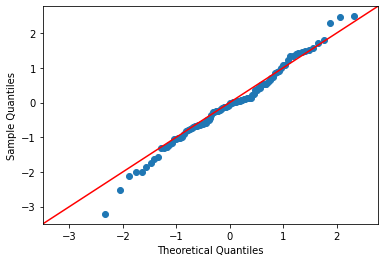

In [1063]:
import numpy as np
import statsmodels.api as sm
import pylab as py
  
# Generate 100 samples from a standard normal (Z) distribution
sample_data1 = np.random.normal(0, 1, 100)
sm.qqplot(sample_data1, line ='45')

py.show()

\[ I have not figured out how to resolve the warning. If someone does, please let me know\]

In the above code see what happens when you increase the number of samples to 1000 and then to 10000. 

Next we generate sample from an Exponential distribution  with rate $\lambda =1 $  and get the Q-Q plot. 

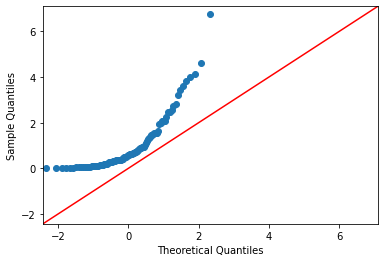

In [1064]:
# Generate 100 samples from an exponential distribution with rate $\lambda =1 $
sample_data1 = np.random.exponential(1, 100)
sm.qqplot(sample_data1, line ='45')
py.show()

### 7.2 Q-Q Plot with 2 Samples 

qqplot_2samples gives the Q-Q plots for the quantiles derived from two data sets. We will consider the size of both samples to be the same althougth it is not required. In following code see what happens as you increase the number of samples

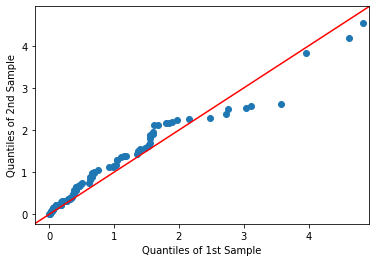

In [1068]:
# Generate 100 samples from an exponential distribution with rate $\lambda =1 $
sample_data1 = np.random.exponential(1, 100)
# Generate another 100 samples from the  exponential distribution with rate $\lambda =1 $
sample_data2 = np.random.exponential(1, 100)
sm.qqplot_2samples(sample_data1, sample_data2, line ='45')
py.show()

### 7.3 A Simple Task

For this project, using the qqplot_2samples, get the Q-Q plot of the inter-packet delays generated in Section 4.5 with that of the baseline. Use only the inter-packet delays that contain the the secret message. Use the same number of inter-packet delays from the baseline traffic. 

[8.97889270e-04 4.98417084e-03 1.88158090e-02 6.91716240e-02
 7.42911557e-02 1.31416188e-01 1.92420904e-01 3.08570216e-01
 3.29251975e-01 3.42913645e-01 4.08205142e-01 4.41230373e-01
 4.74464649e-01 4.80172724e-01 5.64370800e-01 5.87938109e-01
 6.11858558e-01 7.31507825e-01 7.92236851e-01 7.98694106e-01
 1.01780738e+00 1.03861790e+00 1.11804100e+00 1.24384812e+00
 1.42116405e+00 1.43317173e+00 2.40861508e+00 2.58123330e+00
 2.61497983e+00 2.66631227e+00 3.93911560e+00 7.01555752e+00]
[0.001104246, 0.006532287, 0.033204516999999996, 0.07820445000000001, 0.17427499999999999, 0.24128099999999997, 0.03479350000000003, 0.021858299999999997, 0.016695600000000033, 0.01445659999999993, 0.24829460000000003, 0.26099590000000006, 0.03414699999999993, 0.13881500000000013, 0.21728799999999993, 0.045984000000000025, 0.23240499999999997, 0.05338799999999999, 0.22703700000000016, 0.06188799999999972, 0.028604000000000074, 0.027172000000000196, 0.05866399999999983, 0.0036360000000001946, 0.165553999999

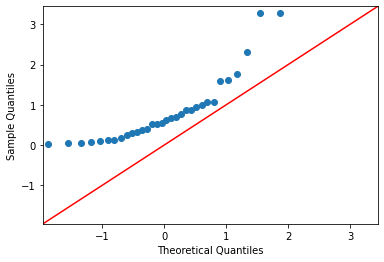

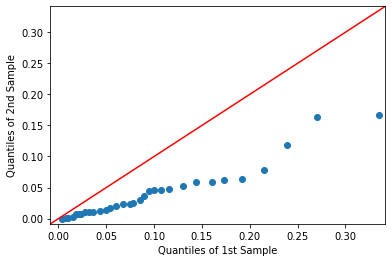

In [1189]:
print(raw_application_times.traffic)
# sm.qqplot(raw_application_times.traffic, line ='45')

ex = np.zeros(len(E))
# ex[0] = E[0]
for i in range(1, len(E)):
    # ex[i][0] = i - 1
    ex[i] = (E[i] - E[i - 1])/1000.0

# baseline
sorted(inter_packet_arrival_time)
print(inter_packet_arrival_time, len(inter_packet_arrival_time))
# inter_packet_arrival_time = inter_packet_arrival_time/1000
nn = np.array(inter_packet_arrival_time)
sm.qqplot(raw_interpacket_times.traffic, line ='45')
# sm.qqplot(nn, line ='45')
print(ex)
ex.sort
# sm.qqplot(ex, line ='45')

sm.qqplot_2samples(nn, ex, line ='45')
# if eve is listening, then she'll have the delays as bob but not the data.
# E = []
print()
py.show()

Include the code and that will generate the plot. 

Include the plot here. 

## One Final Step 

Now we will add a real source that can generate traffic with any given arbitrary distribuition. In fact we can feed a real traffic trace as well.  In order to do that we can we have integrate 

In [1049]:
# This extends the simulator module to insert live traffic

# I dont remember how i wrote the basetrafficgenerator
class NewTrafficGenerator:
    def __init__(self, number_of_packets):
        # self._type = t_type
        self._target = number_of_packets
        self._counter = 0
        
    def create_simple_traffic(self):
        if self._counter < self._target:
            yield int(random.randint(2, 100))
        yield "Stop"
        
    def generate_traffic(self):
        tf = self.create_simple_traffic()
        value = next(tf)
        self._counter += 1
        print(value)
        if value == "Stop":
            # end of simulation
            return False
        else:
            return value
        
# Test

# X = NewTrafficGenerator(number_of_packets=5)
# for i in range(6):
#     print(X.generate_traffic())

In [1061]:
def simulate_ver4_w_live(message, alice_buffer, bob_buffer, batch_size, live = False, raw_application_times = None, raw_interpacket_times=None, debug = False):
    """This is the main version that we're using for this assignment. This adds
    another queue in the event queue to add packets coming from a live source
    """
    live_traffic_queue = []
    if live is not None:
        # We'll create a live traffic with random data coming at a specific
        # interval.
        LiveTrafficSource = NewTrafficGenerator(number_of_packets=live["num_packets"])
        live_traffic_period = live["period"]
    
    event_queue = []
    time = 0
    event_idx = 0
    fail_reason = 0
    if raw_application_times is None:
        # The user wants to generate the application dealy on each simulation
        raw_application_times = Application(name="app delay",
                                    traffic_type="Uniform",
                                    length=len(message_32),
                                    params={"low":0, "high": 1})
        # raw_application_times = Application(name="app delay",
        #                             traffic_type="Exponential",
        #                             length=len(message_32),
        #                             params={"lambda":1})
    if raw_interpacket_times is None:
        # The user wants to generate the application dealy on each simulation
        raw_interpacket_times = Encoder(name="end delay",
                                    traffic_type="Uniform",
                                    length=len(message_32),
                                    params={"low":0, "high": 1})

        # raw_interpacket_times = Encoder(name="end delay",
        #                                 traffic_type="Exponential",
        #                                 length=len(message_32),
        #                                 params={"lambda":1})
        
    # We need the initial packet to be enqued in the event queue. we already have
    # the input messages message_16 and message_32
    if debug == True:
        print(f"The application generated this message to send: {message}")
    # Encoding times can be calculated using the distribution. The encoding times
    # are randomly computed wile processing an event.
    #--
    processed_application_times = process_time_arrays(
                                        raw_application_times.get_traffic_delay())
    # print(processed_application_times)
    # create an event to encode all the packets. First create packets for all the
    # binary strings. The simulation will end when all the packets are transmitted.
    packet_push_queue = []
    pkt_idx = 0
    for idx, bit in enumerate(message):
        # frist create a packet.
        packet = Packet(
                pkt_idx=pkt_idx, data=bit,
                enqueue_time=int(processed_application_times[idx]))
        # we dont know how long will it take to process this packet. this time will
        # determined by the encoding latency. create an event to find out the
        # encoding time.
        packet_push_queue.append(packet)
        pkt_idx += 1
    
    # check_for live traffic
    if live is not None:
        packet = Packet(pkt_idx=9000+pkt_idx, data=int(LiveTrafficSource.generate_traffic()%2), enqueue_time=0)
        live_traffic_queue.append(packet)
        # not incrementing the pkt idx for simplicity
    # enter the first packet manually so that the simulation can start.
    event_queue = insert_event_ver2(event=EventV2(idx=event_idx,
                                init_time=packet_push_queue[0].enqueue_time,
                                batch_size=batch_size,
                                packet=packet_push_queue[0],
                                params=raw_interpacket_times.get_stats()),
                            queue=event_queue)
    event_idx += 1
    # see where the live traffic queue is at:
    event_queue = insert_event_ver2(event=EventV2(idx=9000+event_idx,
                                init_time=live_traffic_queue[0].enqueue_time,
                                batch_size=batch_size,
                                packet=live_traffic_queue[0],
                                params=raw_interpacket_times.get_stats()),
                            queue=event_queue)
    packet_push_queue = packet_push_queue[1:]
    simulation_status = True
    
    ###########################################################################
    ## simulation queue
    ###########################################################################
    
    # TODO: take this function out of simulate and create a new function.
    
    max_time = 100000   # simulate for 100 sim seconds
    for time in range(0, max_time): #int(1e20)):
        # ------------------------------------------------------------------- #
        if len(event_queue) == 0 and len(packet_push_queue) == 0:
            if debug == True:
                print("All events processed!")
            break
        # ------------------------------------------------------------------- #
        
        # If there  are events in the packet_push_queue are there in the future
        if len(packet_push_queue) > 0:
            packets_to_delete = []
            events_to_add = []
            # There can be multiple packets scheduled to be processed at this
            # time.
            for pkt in packet_push_queue:
                if pkt.enqueue_time == time:
                    # insert this packet into the event queue
                    events_to_add.append(EventV2(idx=event_idx,
                                    init_time=time,
                                    batch_size=batch_size,
                                    packet=pkt,
                                    params=raw_interpacket_times.get_stats()))
                    event_idx+=1
                    packets_to_delete.append(pkt)
                    
            for pkt in packets_to_delete:
                packet_push_queue.remove(pkt)
            for events in events_to_add:
                event_queue = insert_event_ver2(event=events, queue=event_queue)
        
        # add a new packet from the live source after the specified period
        if time != 0 and (time % live_traffic_period) == 0:
            data = LiveTrafficSource.generate_traffic()
            if data != False:
                if debug == True:
                    print(f"liv: inserting packet with idx {9000+pkt_idx} and data {data} at time {time} with live counter {LiveTrafficSource._counter}")
                packet = Packet(pkt_idx=9000+pkt_idx, data=int(data%2), enqueue_time=time)
                live_traffic_queue.append(packet)
                pkt_idx += 1
            else:
                if debug == True:
                    print("liv: Live data source has no more data to generate!")
        
        if len(live_traffic_queue) > 0:
            # using a ;azy implementation here. no two packets will be
            # generated at the same time.
            print("here")
            if time == live_traffic_queue[0].enqueue_time:
                event_queue = insert_event_ver2(event=EventV2(idx=9000+event_idx,
                                    init_time=live_traffic_queue[0].enqueue_time,
                                    batch_size=batch_size,
                                    packet=live_traffic_queue[0],
                                    params=raw_interpacket_times.get_stats()),
                                queue=event_queue)
                live_traffic_queue = live_traffic_queue[1:]
     
        # get the head of the event queue
        if len(event_queue) > 0:
            events_to_delete = []
            events_to_add = []   
            # print(time)
            if time > event_queue[0]._init:
                print("error! we cannot have any events scheduled in the past",
                      event_queue[0]._idx, event_queue[0]._init,
                      time, len(event_queue))
                raise ValueError

            # there can be multiple events to process at this time.
            for event in event_queue:
                # print(event._init)
                # if simulation_status == False:
                #     break
                if event._init == time and simulation_status == True:
                    
                    status = process_event(event, time, alice_buffer,
                                           bob_buffer, batch_size, debug)
                    if status["success"] == True:
                        # This event is successfully processed!
                        events_to_delete.append(event)
                        # for buf in alice_buffer.buffer:
                        #     print(buf.get_data(), end = " ")
                        # print("size", len(event_queue))
                    else:
                        # success is False
                        # check if there are errors
                        # print(status["error_stats"])
                        if status["error_stats"][0] == True:
                            # there was an overflow!
                            simulation_status = False
                            fail_reason = 1
                            break
                        elif status["error_stats"][1] == True:
                            # there was an overflow!
                            simulation_status = False
                            fail_reason = 2
                            break
                    # Are there new events to be queued into the event queue?
                    for new_events in status["new_events"]:
                        events_to_add.append(new_events)
                    # Are there any updates to the buffers?
                    if status["additional_items"][0] == True:
                        # update alice's buffer!
                        alice_buffer = status["additional_items"][1]
                else:
                    break
            
            if simulation_status == False:
                break
            
            for events in events_to_delete:
                event_queue.remove(events)
            
            for events in events_to_add:
                event_queue = insert_event_ver2(event=events, queue=event_queue)
                            
        if len(event_queue) == 0 and len(packet_push_queue) > 0:
            print(f"fatal: outside queue buffer underflow at {time}")
            print(f"debug: next event init time: ", packet_push_queue[0].enqueue_time)
            simulation_status = False
            fail_reason = 2
            break
    
        if simulation_status == False:
            break
    if len(event_queue) > 0:
        for ev in event_queue:
            print(ev._init, end=" " )
        # print(event_queue[0]._init, event_queue[1]._init) #, packet_push_queue[0]._idx)
        if len(packet_push_queue) > 0: 
            print()    
            print(packet_push_queue, packet_push_queue[0]._idx, packet_push_queue[0].enqueue_time)
    print(f"completed simulation with time {float(time) * 0.001} s")
    return simulation_status, fail_reason
    
simulation_length = 1
result_array = []
success_count = 0
overflow = 0
underflow = 0
# from tqdm.tqdm import tqdm

class BatchedBuffers(Buffer):
    def __init__(self,
                 buffer_name: str,
                 buffer_size: int,
                 batch_size: int,
                 debug: bool = False):
        super().__init__(buffer_name=buffer_name,
                       buffer_size=buffer_size,
                       debug=debug)
        
        self.batch_size = batch_size
        self.buffering_phase = True

for i in range(simulation_length):
    # Buffer()
    batch_size = 1
    Ax = BatchedBuffers(buffer_name="alice_x", buffer_size=20, batch_size=batch_size) #, debug=True)
    # Bob doesnot care if the buffer is batched
    Bx = Buffer(buffer_name="bob_x", buffer_size=200)
    
    result_array.append(simulate_ver4_w_live(message_32, Ax, Bx, batch_size, live = {"num_packets": 20, "period" : 100} , debug = True))
    success_count += int(result_array[i][0])
    if result_array[i][1] == 1:
        overflow += 1
    elif result_array[i][1] == 2:
        underflow += 1
    for pkt in Bx.buffer:
        print(pkt.data, end = " ")

print()
print("overflow",overflow, "  underflow", underflow, "  success rate", float(success_count) * 100/simulation_length, "%")

The application generated this message to send: [0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0]
13
here
info: processing event idx 9001 with action PUSH at time 0 with packet idx 9032 and data 1 with end time 833
info: processing event idx 9001 with action PUSH at time 0 with packet idx 9032 and data 1 with end time 791
info: processing event idx 0 with action PUSH at time 14 with packet idx 0 and data 0 with end time 452
info: processing event idx 1 with action PUSH at time 18 with packet idx 1 and data 0 with end time 124
info: processing event idx 2 with action PUSH at time 55 with packet idx 2 and data 1 with end time 960
info: processing event idx 3 with action PUSH at time 90 with packet idx 3 and data 1 with end time 645
info: processing event idx 4 with action PUSH at time 95 with packet idx 4 and data 1 with end time 980
71
liv: inserting packet with idx 9032 and data 71 at time 100 with live counter 2
here
info: processing even

## 8 Submission and Grading Guidelines

For this project  there is one input file and some input figures (the drawings). You will write code  which will generate results and figures. 

1. Put this jupyter notebook, the input file, and the result figures you generaye in one folder. Make sure that paths are set properly and  the figures will render when I open the notebook. 

2. Submit a zipfile of the folder. 

3. There will be interactive grading

In [ ]:
# please see https://github.com/kaustav-goswami/buffer-simulator.git
#
# > git clone https://github.com/kaustav-goswami/buffer-simulator.git
# > python3 main.py
#